<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Cheap-memory-(don't-save-history)" data-toc-modified-id="Cheap-memory-(don't-save-history)-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Cheap memory (don't save history)</a></span></li></ul></div>

In [1]:
import networkx as nx
import numpy as np
from matplotlib import pyplot as plt

In [133]:
# Try to load football from the internet
import urllib.request
import io
import zipfile

def load_football():
    url = "http://www-personal.umich.edu/~mejn/netdata/football.zip"
    sock = urllib.request.urlopen(url)  # open URL
    s = io.BytesIO(sock.read())  # read into BytesIO "file"
    sock.close()

    zf = zipfile.ZipFile(s)  # zipfile object
    txt = zf.read("football.txt").decode()  # read info file
    gml = zf.read("football.gml").decode()  # read gml data
    # throw away bogus first line with # from mejn files
    gml = gml.split("\n")[1:]
    G = nx.parse_gml(gml)  # parse gml data
    return G

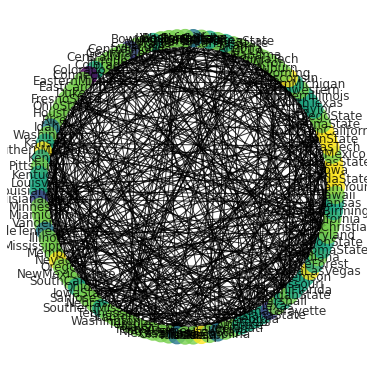

In [134]:
G = nx.karate_club_graph()
G = load_football()

degree_centrality = nx.degree_centrality(G)
color_centrality = list(degree_centrality.values())

plt.figure(figsize=[5, 5])
nx.draw_circular(G, 
                 node_color=color_centrality,
                 alpha=0.8,
                 with_labels=True)
plt.show()



# More beautiful network

In [136]:
# Spring layout: closer is better connected
pos = nx.spring_layout(G)

In [4]:
# Save network position
# np.savez('karateclub_pos.npz', pos=pos)

In [5]:
# # Load previously saved network position
# d = np.load('karateclub_pos.npz', allow_pickle=True)
# pos = d['pos'].item()

In [43]:
# # Circular
# pos = nx.circular_layout(G)

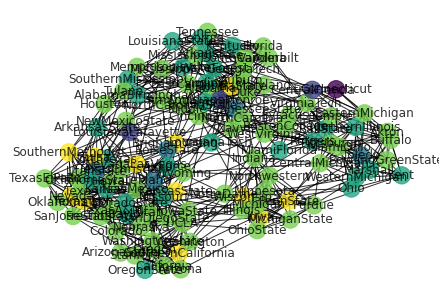

In [137]:
# Draw more beautiful network
nx.draw(G, 
        pos=pos, 
        node_color=color_centrality,
        alpha=0.8,
        with_labels=True)
plt.show()

In [7]:
def get_neighbors(G):
    neighbors = dict()
    for player in G.nodes():
        n_list = list(G.neighbors(player))  # neighbor list
        neighbors.update({player: n_list})
    return neighbors

def count_neighbors(neighbors):
    num_neighbors = dict()
    for player, n_list in neighbors.items():
        num_neighbors.update({player: len(n_list)})
    return num_neighbors

In [8]:
# edge list and adjacenc matrix
# other representations of the network
edge_list = list(G.edges()) 
adj = nx.convert_matrix.to_numpy_matrix(G)

# neighbor list for each person
neighbors = get_neighbors(G)
num_neighbors = count_neighbors(neighbors)
#
person = 2
print(f"person {person} has neighbors {neighbors[person]}")
print(f"person {person} has a total of {num_neighbors[person]} neighbors")
print(f"person {person} has degree centrality {degree_centrality[person] :.3f}")

person 2 has neighbors [0, 1, 3, 7, 8, 9, 13, 27, 28, 32]
person 2 has a total of 10 neighbors
person 2 has degree centrality 0.303


In [9]:
# sum of 2 = lose -> both get 0 points
# sum of 1 = D wins = #1 wins -> get "b" points > 1 :(
# sum of 0 = both collaborate = get 1 point
def get_points(role, pts_DD=0, pts_DC=1.3, pts_CC=1):
    """Points after a round of Prisoner's Dilemma on a network.
    0=collaborator, 1=defector. Sum of each pair of people.
    Rules:
        - sum=2 -> both lose     -> each gets pts_DD=0
        - sum=1 -> defector wins -> defector gets pts_DC=1.3
        - sum=0 -> both win      -> each gets pts_CC=1
    """
    points = np.zeros(G.number_of_nodes())
    for edge in edge_list:
        i, j = edge                   # persons i and j
        role_edge = role[list(edge)]  # defector=1 or collaborator=0?
        sum_edge = sum(role_edge)     # sum of each pair of people
        # examine interaction based on sum 
        if sum_edge == 0:
            points[i] += pts_CC  # both collaboration
            points[j] += pts_CC
        elif sum_edge == 2:
            points[i] += pts_DD
            points[j] += pts_DD  # both defect
        else:
            if role[i] == 1: # i is defector
                points[i] += pts_DC
            else:            # j is defector
                points[j] += pts_DC
    return points

def get_new_mutrole(role, neighbors, points_norm, G, p_m = 0):
    """Adopt the strategy of whoever is winning of your neighbors 
    and look at yourself. Make error with choosing role with mutation 
    value set by p_m"""
    new_role = np.zeros(len(role))
    for player in range(G.number_of_nodes()):
        n_list = neighbors[player].copy()
        n_list.append(player)
        # n_list = n_list[::-1]  # keep your own role
        n_pts = points_norm[n_list]
        n_roles = role[n_list]
        max_pts = max(n_pts)
        all_winners_index = np.argwhere(n_pts==max_pts).flatten()
        all_winners_players = np.array(n_list)[all_winners_index]
        all_winners_roles = n_roles[all_winners_index]
        # select 1 winner
        # winner = np.random.choice(all_winners_players)
        winner = all_winners_players[0]  # choose self
        winner_role = role[winner]
        # add randomness 
        if np.random.rand() < p_m:
            new_role[player] = (winner_role + 1) % 2
        else:
            new_role[player] = winner_role 
    return new_role

1. Very jealous agent. Worst loser disconnects from her highest-scoring friend. Connect to random new person.
    
2. Easily influenced. Worst loser disconnects from her least-connected friend. Connect to the most-connected agent. 

3. Extreme altruist. Biggest winner disconnects from her highest-scoring friend. Connects to someone random. Opposite of rewire_lowest (very jealous agent). 


4. Most successful cooperator wants to create a local utopia. If they're connected to a defector --> sever. Connect to another cooperator who is a friend-of-a-friend. 


Hard: Someone who is very successful (defector or cooperator) and poaches a cooperator. The poachee has to sever an edge. 

In [106]:
def rewire_to_utopia(all_points, graph, role):
    """Most successful cooperator wants to create a local utopia. 
    If they're connected to a defector --> sever. Connect to 
    any other cooperator. 
    
    If they're not connected to any defectors, do nothing.
    (if it ain't broke don't fix it)"""
    # identify cooperators
    cooperators = np.argwhere(role==0).flatten()
    if len(cooperators) >=2:
        # # print(f'coops: {cooperators}')
        # find the cooperator who is winning
        cooperator_scores = all_points[cooperators]
        highest_score = np.max(cooperator_scores)
        highest_index = np.argwhere(cooperator_scores==highest_score).flatten()
        best_coop_index = np.random.choice(highest_index)
        best_coop = cooperators[best_coop_index]
        # # print(f'best coop: {best_coop}')
        # see if best coop has any defector leaches
        neighbors = [n for n in graph.neighbors(best_coop)]
        neighbors = np.array(neighbors)
        # # print(neighbors)
        # # print(type(neighbors))
        neighbors_roles = role[neighbors]
        defectors_index = np.argwhere(neighbors_roles==1).flatten()
        defectors = neighbors[defectors_index]
        # # print(f'defects: {defectors}')
        if len(defectors) > 0:
            remove_defector = np.random.choice(defectors)
            # # print(f'remove: {remove_defector}')
            # find the other cooperators and pick a stranger
            # i.e. not someone the best coop is connected to already
            other_coops = list(set(cooperators).difference([best_coop]))
            non_neighbors = set(other_coops).difference(neighbors)
            non_neighbors = list(non_neighbors)
            if len(non_neighbors) > 0:
                # FUTURE: pick highest centrality
                new_coop = np.random.choice(non_neighbors)
                # rewiring
                graph.remove_edge(best_coop, remove_defector)
                graph.add_edge(best_coop, new_coop)
                print(f'{best_coop}: cut {remove_defector}, add {new_coop}')
    return graph

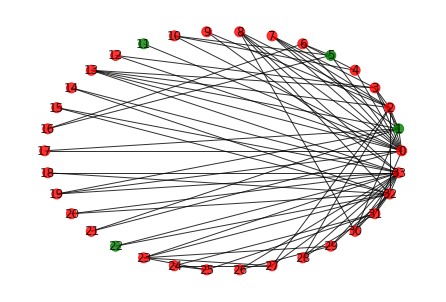

1: cut 30, add 11
Graph named "Zachary's Karate Club" with 34 nodes and 78 edges
[1. 0. 1. 1. 1. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [107]:
# G, role = init_karate_club(num_defectors=30)
# i = rewire_to_utopia(points, G, role)

# print(i)
# print(role[i])

In [138]:
def init_karate_club(num_defectors=10):
    G = nx.karate_club_graph()
    member_index = list(range(G.number_of_nodes()))
    init_Ds = np.random.choice(member_index, num_defectors, replace=False)
    role = np.zeros([G.number_of_nodes()])  # 0 = collaborator
    role[init_Ds] = 1 
    draw_defectors(G, pos, role)
    return G, role

def init_football(num_defectors=10):
    G = load_football()
    member_index = list(range(G.number_of_nodes()))
    init_Ds = np.random.choice(member_index, num_defectors, replace=False)
    role = np.zeros([G.number_of_nodes()])  # 0 = collaborator
    role[init_Ds] = 1 
    draw_defectors(G, pos, role)
    return G, role

In [51]:
def rewire_to_popular(all_points, graph):
    """Easily influenced. Worst loser disconnects from her 
    least-connected friend. 
    Connect to the most-connected agent. """
    # find lowest scorer (worst loser)
    lowest_score = np.min(all_points)   
    losers_index = np.argwhere(all_points == lowest_score).flatten()
    loser_index = np.random.choice(losers_index)
    # identify least-connected neighbor to sever
    # and connect to most popular person
    neighbor_index = np.array(list(graph.neighbors(loser_index)))
    # print(f"loser {loser_index}: {neighbor_index}")
    if len(neighbor_index) > 0:
        # least-connected neighbor
        centrality =  nx.centrality.degree_centrality(graph)
        neighbor_centrality = [centrality[n] for n in neighbor_index]
        ind_loneliest = np.argmin(neighbor_centrality).flatten()[0]
        neighbor_loneliest = neighbor_index[ind_loneliest]
        # find the most popular person on the graph
        most_popular = max(centrality, key=centrality.get)
        # rewiring
        already_edge = graph.has_edge(loser_index, most_popular)
        is_self = loser_index==most_popular
        if already_edge or is_self:
            pass # nothing happens
        else:
            # print(f'rewire to add {loser_index} {most_popular}')
            graph.remove_edge(loser_index, neighbor_loneliest)
            graph.add_edge(loser_index, most_popular)
    
    return graph

In [139]:
# Mobile debugger

# Build intitial Defector distribution
# G, role = init_karate_club()
G, role = init_football()
old_role = role.copy()

num_rounds = 100
role_history = np.zeros([num_rounds + 1, G.number_of_nodes()])
role_history[0, :] = old_role  # initialization is 1st row
# save memory by replacing role_history with num_defectors
num_defectors = [sum(old_role)]  
for round in range(1, num_rounds + 1):
    # Play the game
    points = get_points(old_role, pts_DC = 1.4)
    new_role = get_new_mutrole(old_role, neighbors, points, 
                               G, p_m = 0.01)
    # rewire G function here
    G = rewire_to_utopia(points, G, new_role)
    
    # Save results
    role_history[round, :] = new_role
    num_defectors.append(sum(new_role)) # less data used
    # removed normalization by popularity
    # points_norm = points / np.array(list(player_numneighbors.values()))
    # Top 4 players
    points_rank = np.argsort(points)[::-1]
    best4 = points_rank[0:4]
    # Draw result
    print(f"round {round}")
    draw_defectors(G, pos, old_role, best4)
    # Update network
    old_role = new_role

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [125]:
def no_rewire(points, G, role):
    return G

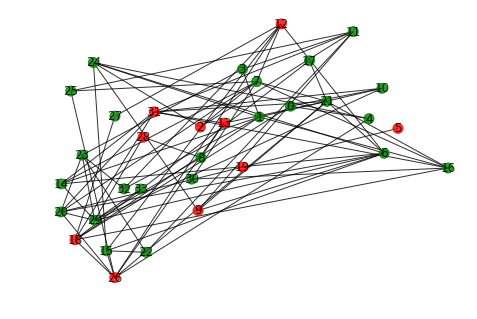

In [42]:
def rewire_lowest(all_points, graph):
    """Very jealous agent. Disconnect from winner. Connect to
    random new person."""
    lowest_score = np.min(all_points)   
    losers_index = np.argwhere(all_points == lowest_score).flatten()
    loser_index = np.random.choice(losers_index)
    neighbor_index = np.array(list(graph.neighbors(loser_index)))
    if len(neighbor_index) > 0:
        neighbor_points = all_points[neighbor_index]
        highest_score = np.max(neighbor_points)
        winners_index = np.argwhere(neighbor_points == highest_score).flatten()
        winner_index = np.random.choice(winners_index)
        # sever_target_nindex = np.argmax(neighbor_points) # neighbor index of biggest winner
        sever_target_Gindex = neighbor_index[winner_index] # G index of biggest winner

        all_agents = list(G.nodes())
        exclude_agents = set([loser_index]).union(neighbor_index)
        not_neighbors = set(all_agents).difference(exclude_agents) 

        # make a new connection with a random not neighbor
        new_neighbor = np.random.choice(list(not_neighbors))

        graph.remove_edge(loser_index, sever_target_Gindex)
        graph.add_edge(loser_index, new_neighbor)
    
    return graph


    


draw_defectors(rewire_lowest(points, G),pos , role)



In [14]:
def draw_defectors(G, pos, role, best=[], color_C='g', color_D='r'):
    colors = []
    sizes = []
    for v in G.nodes():
        if role[v] == 1:
            color = color_D
        else:
            color = color_C
        colors.append(color)
        if v in best:
            size = 500
        else:
            size = 100
        sizes.append(size)
    nx.draw(G, pos=pos, with_labels=True, 
            node_color=colors, 
            alpha=0.8, 
            node_size=sizes)
    plt.show()
    pass

# Initialize

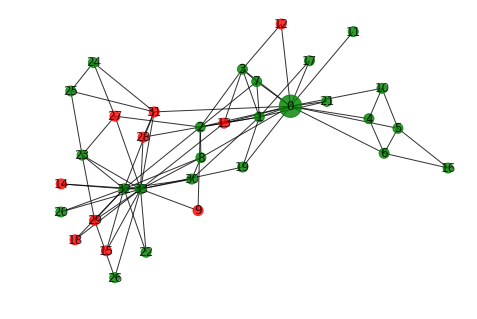

In [63]:
# Build intitial Defector distribution
G = nx.karate_club_graph()

num_defectors = 10
member_index = list(range(G.number_of_nodes()))
init_Ds = np.random.choice(member_index, num_defectors, replace=False)

role = np.zeros([G.number_of_nodes()])  # 0 = collaborator
role[init_Ds] = 1                       # 1 = defector

draw_defectors(G, pos, role, [0])

# Play a couple rounds

round 1


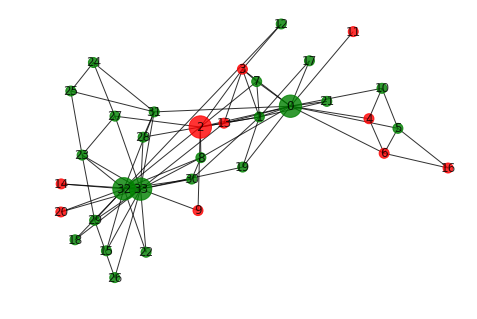

round 2


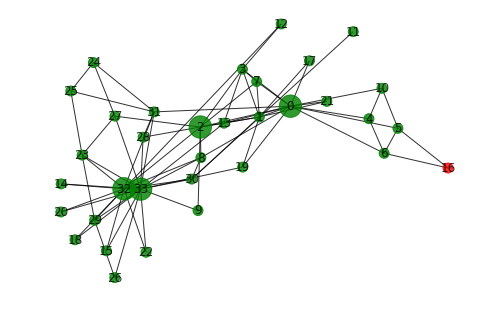

round 3


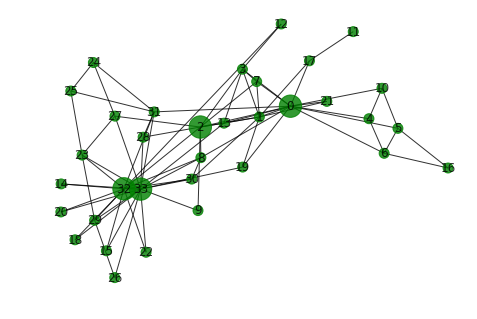

round 4


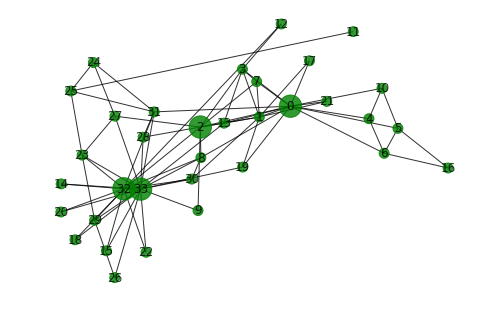

round 5


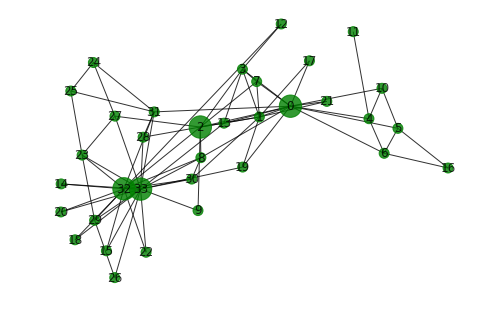

round 6


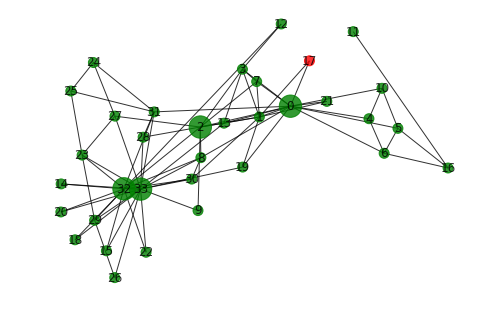

round 7


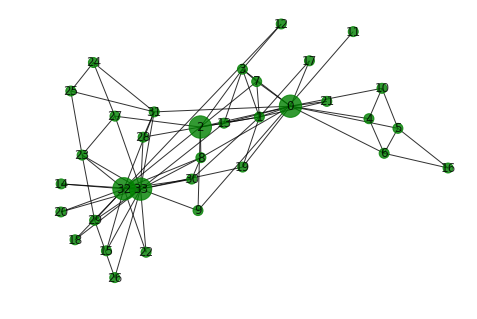

round 8


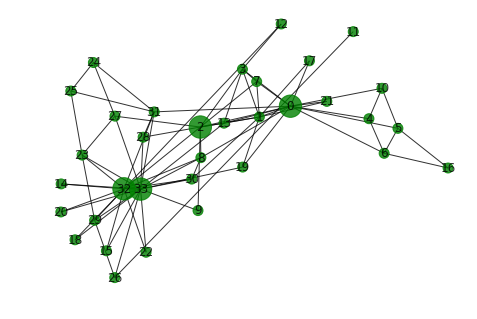

round 9


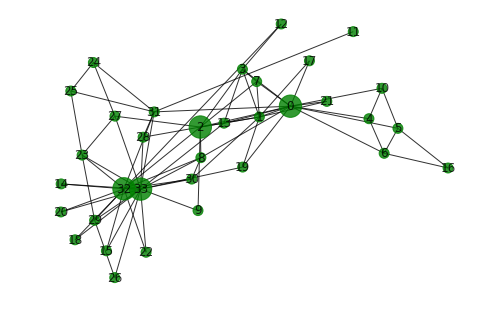

round 10


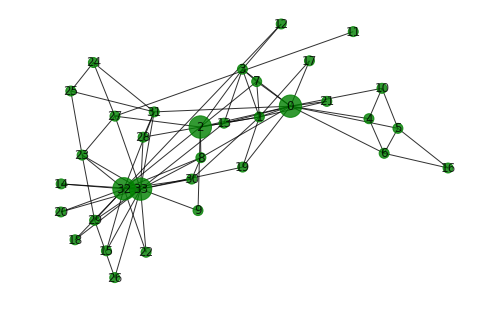

round 11


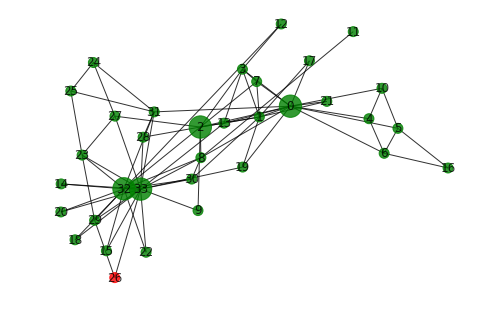

round 12


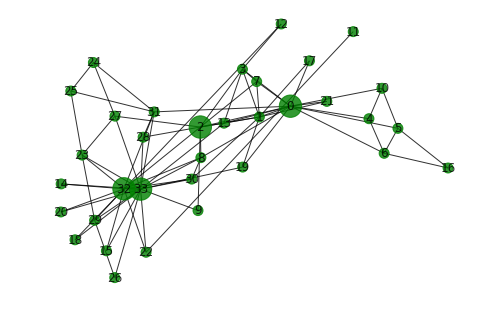

round 13


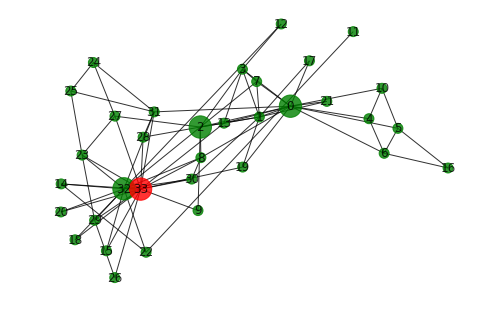

round 14


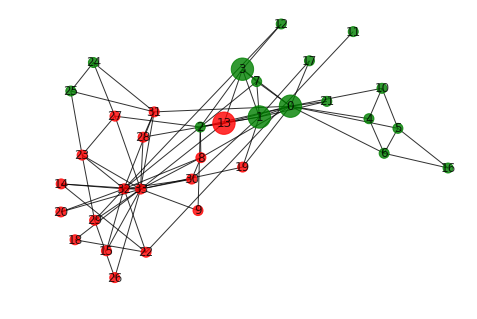

round 15


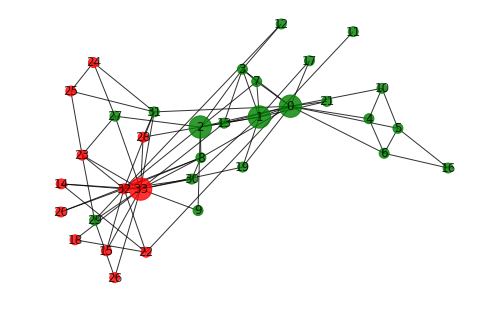

round 16


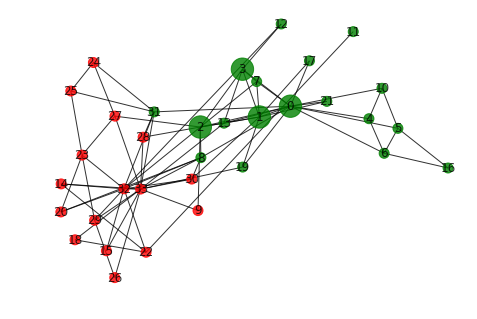

round 17


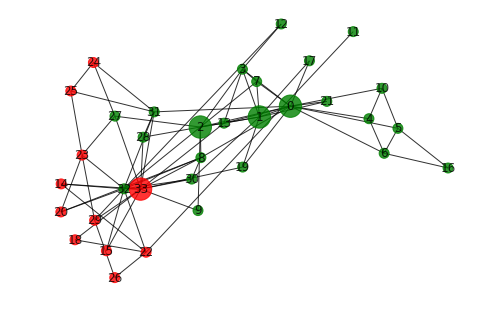

round 18


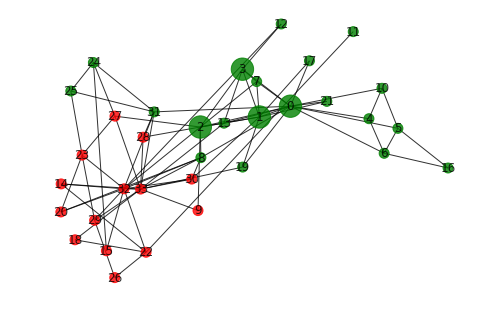

round 19


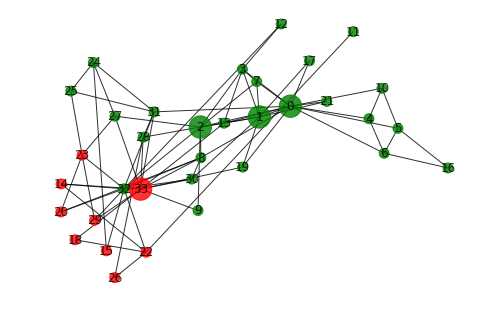

round 20


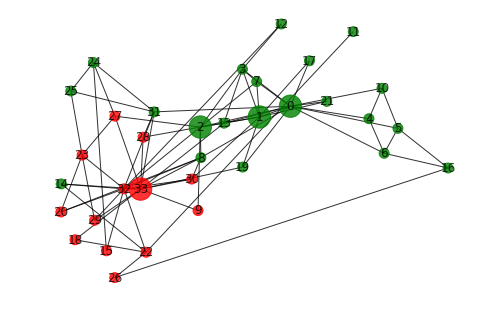

round 21


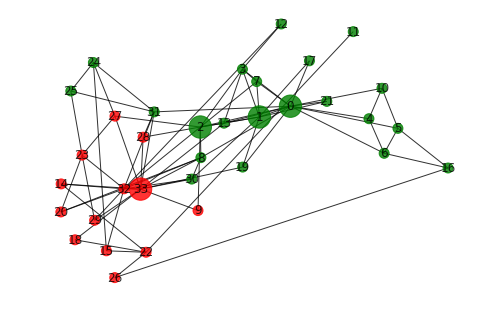

round 22


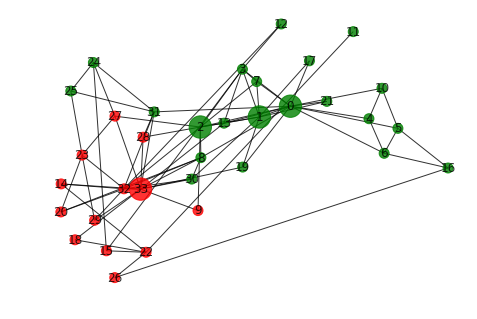

round 23


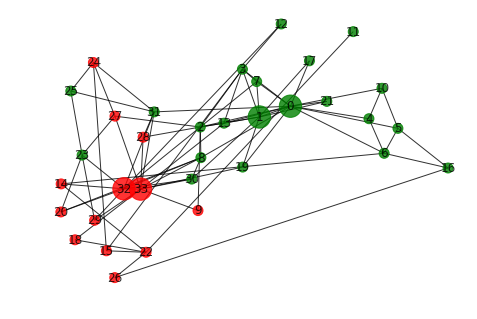

round 24


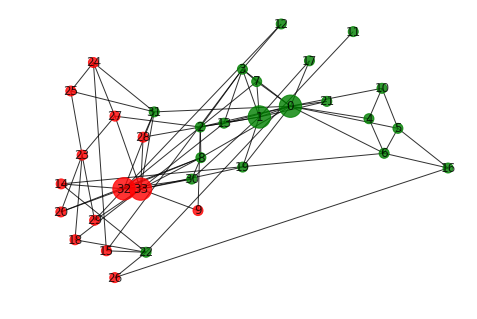

round 25


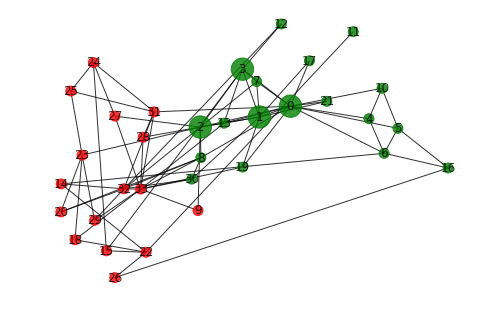

round 26


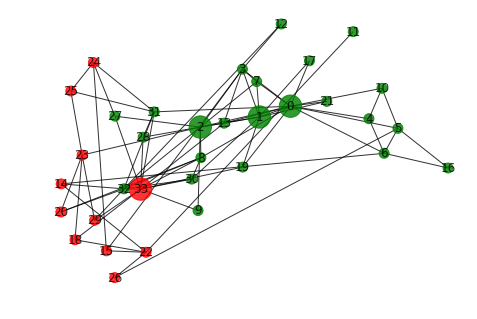

round 27


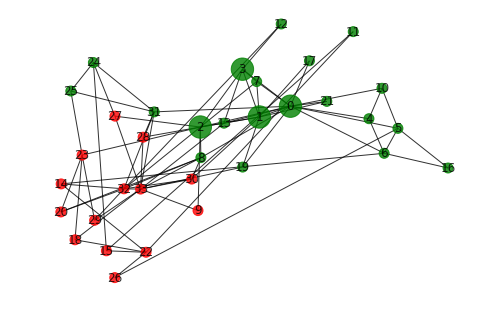

round 28


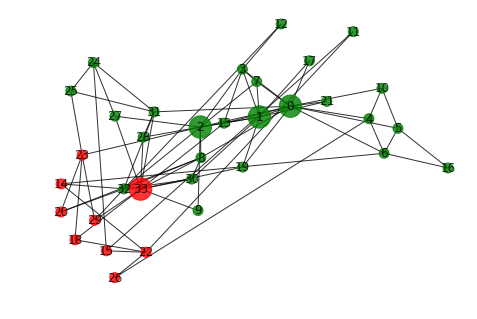

round 29


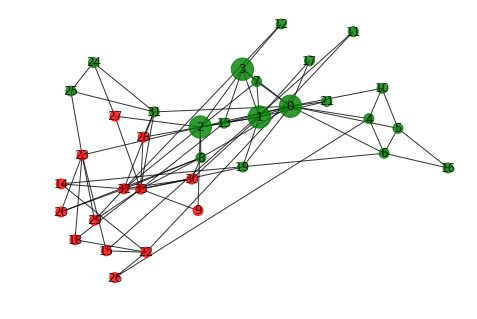

round 30


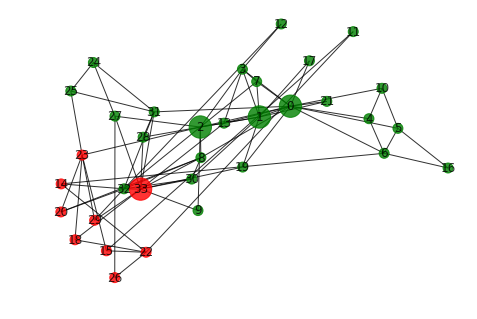

round 31


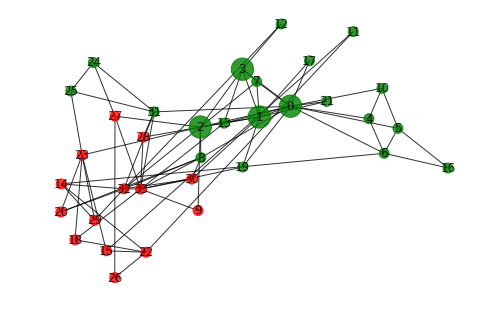

round 32


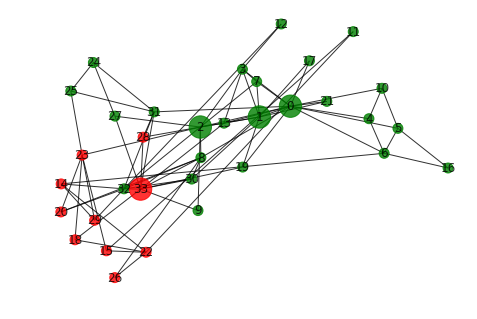

round 33


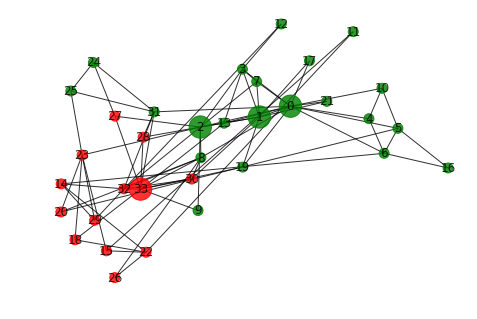

round 34


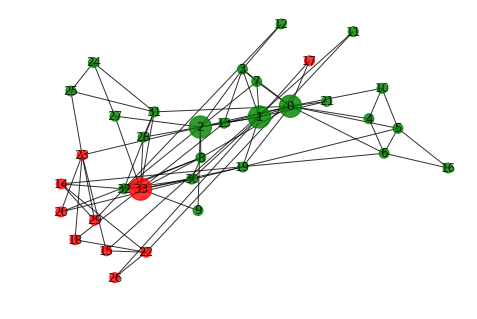

round 35


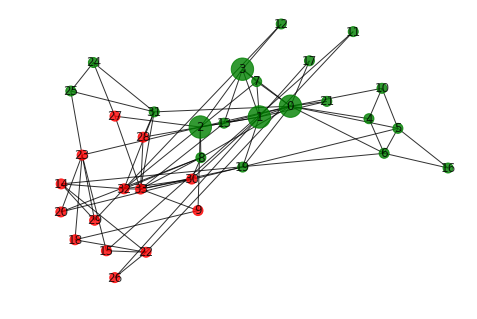

round 36


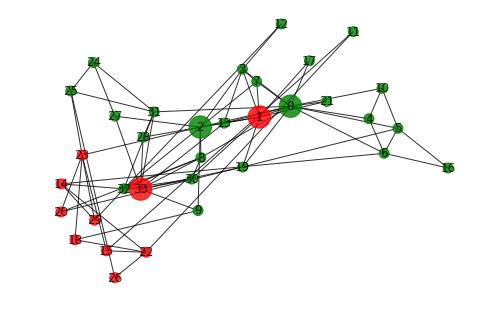

round 37


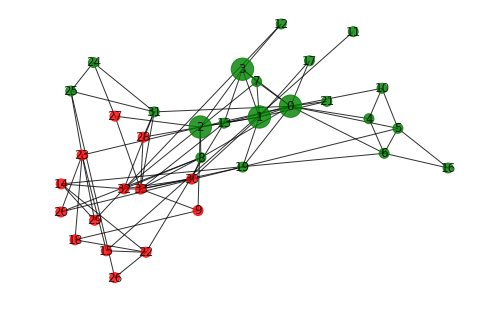

round 38


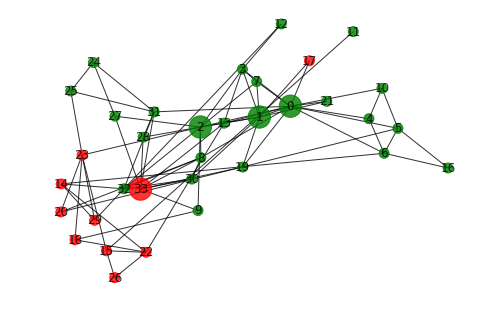

round 39


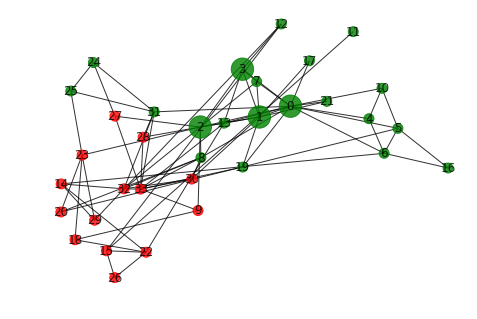

round 40


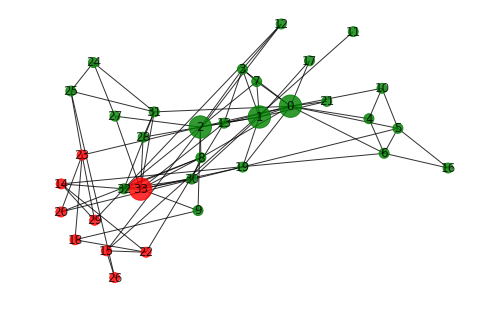

round 41


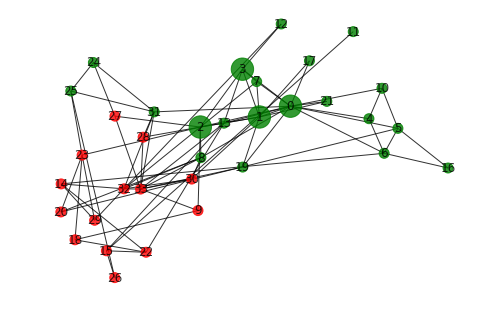

round 42


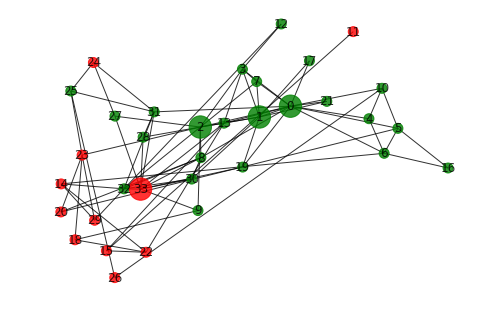

round 43


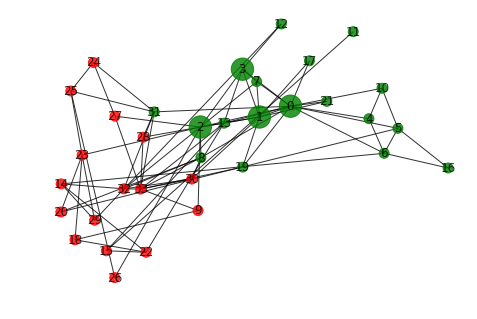

round 44


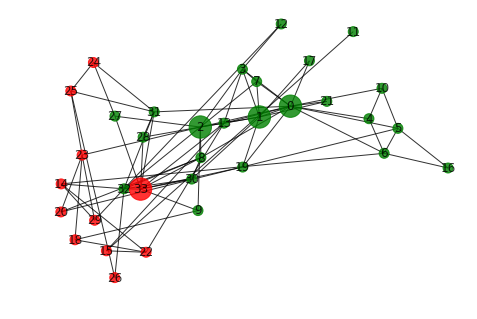

round 45


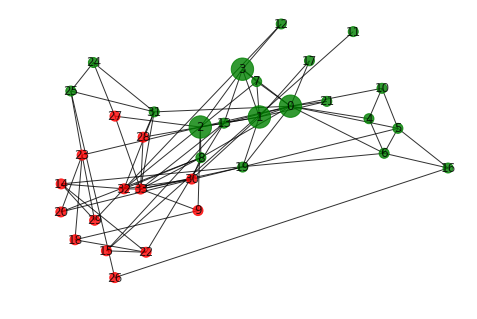

round 46


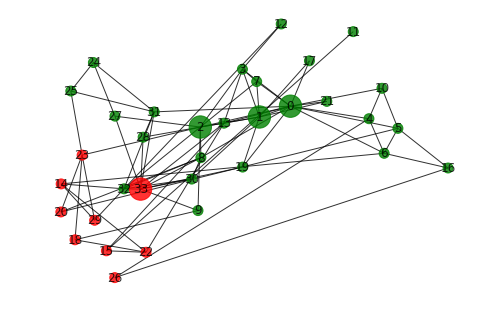

round 47


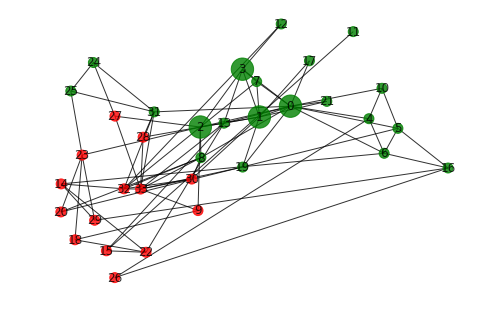

round 48


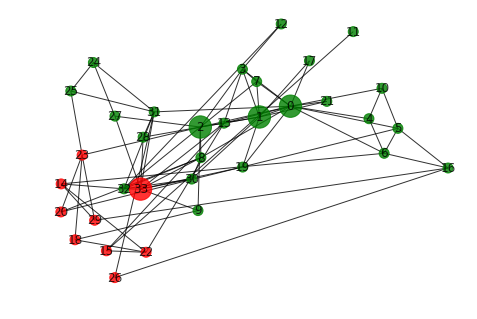

round 49


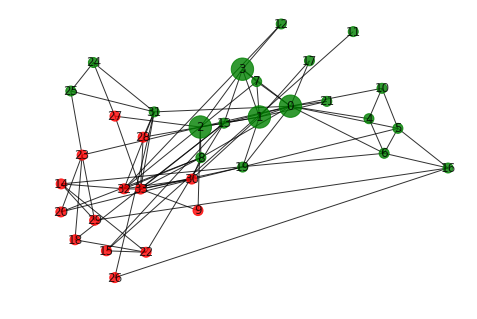

round 50


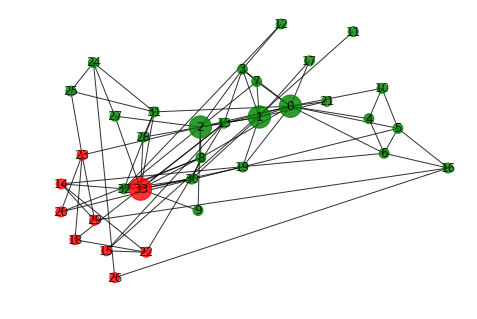

round 51


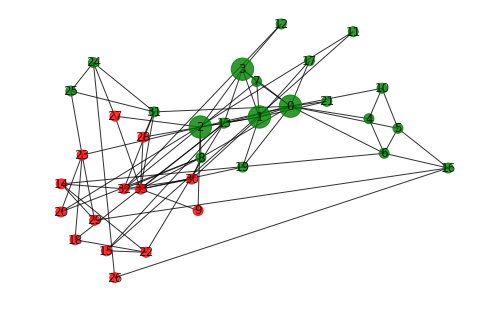

round 52


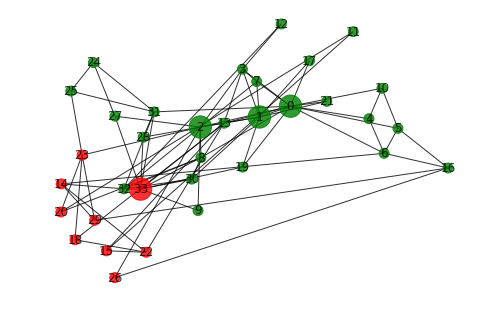

round 53


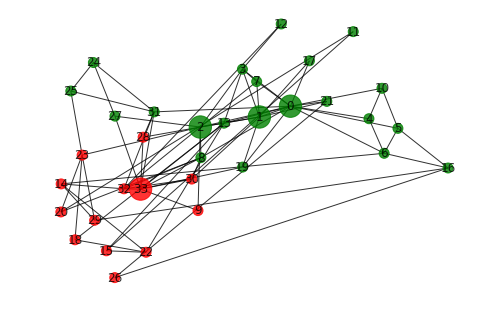

round 54


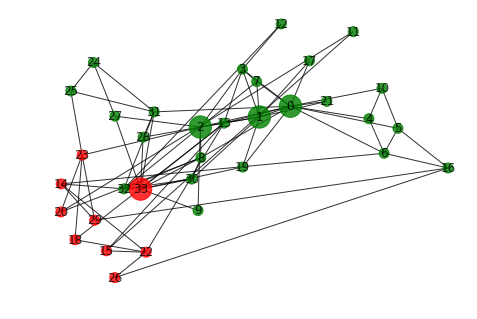

round 55


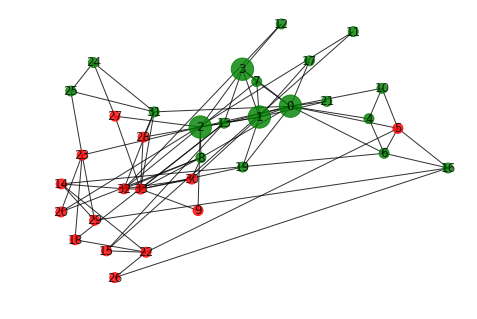

round 56


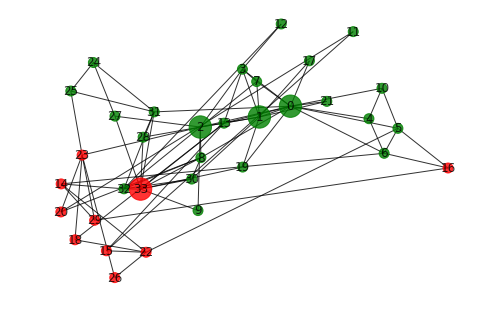

round 57


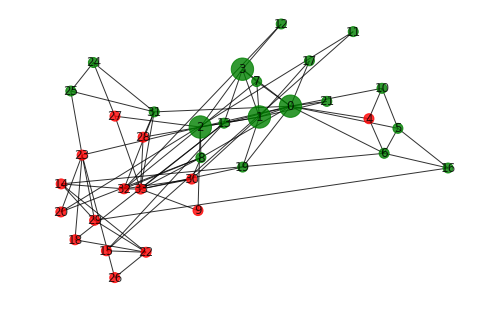

round 58


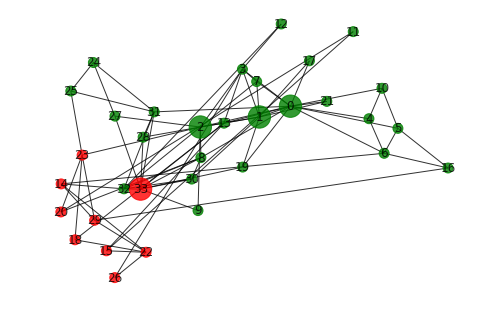

round 59


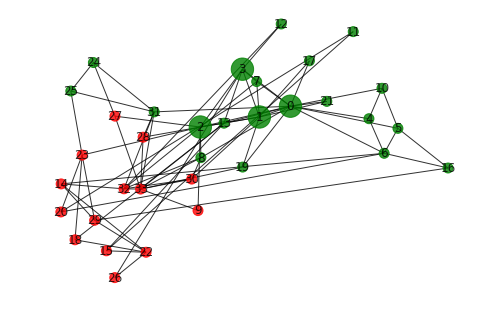

round 60


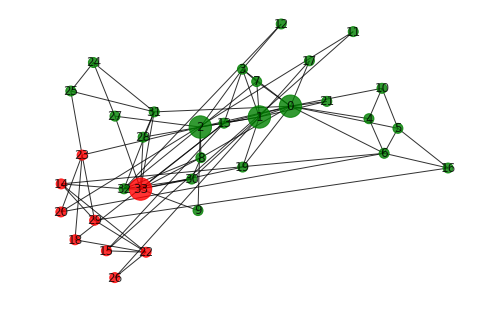

round 61


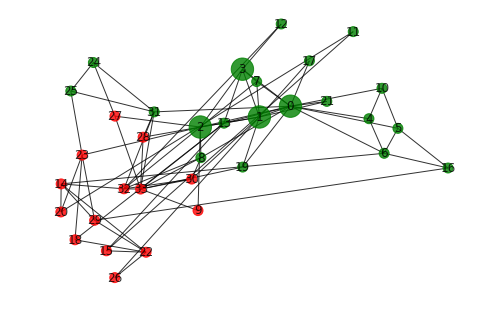

round 62


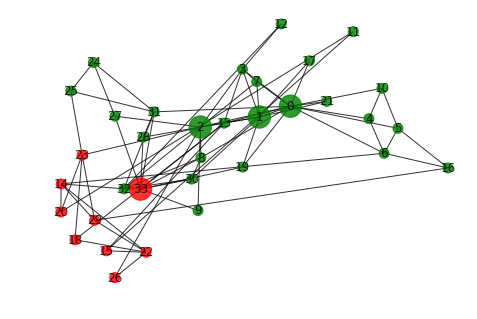

round 63


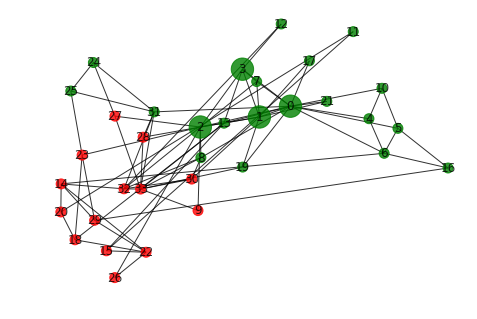

round 64


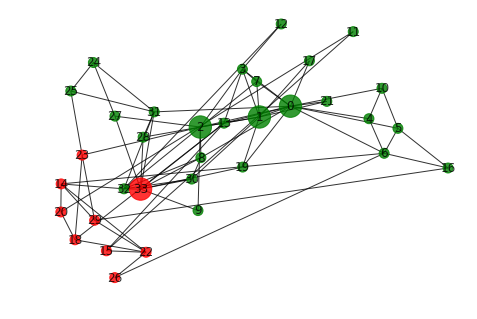

round 65


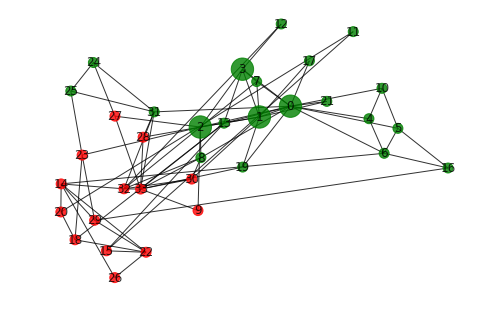

round 66


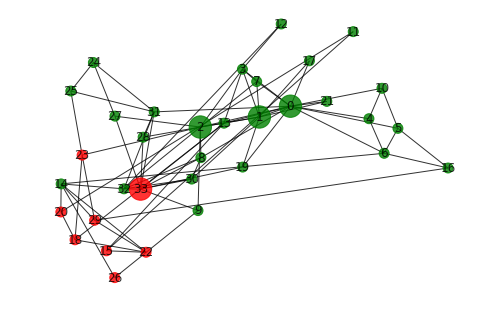

round 67


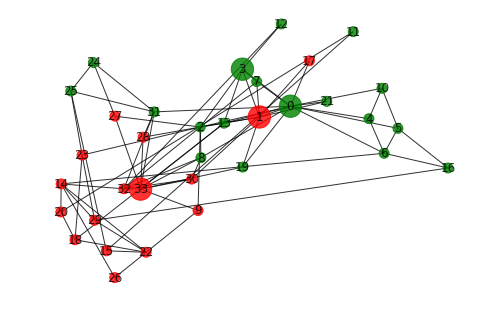

round 68


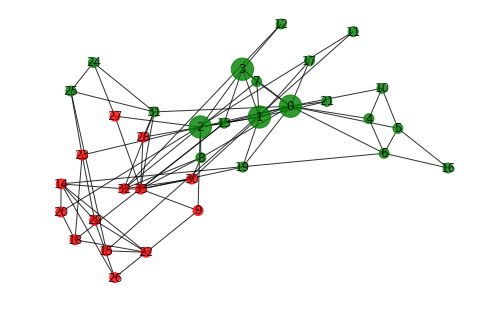

round 69


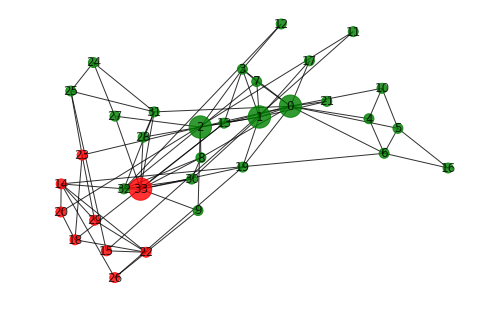

round 70


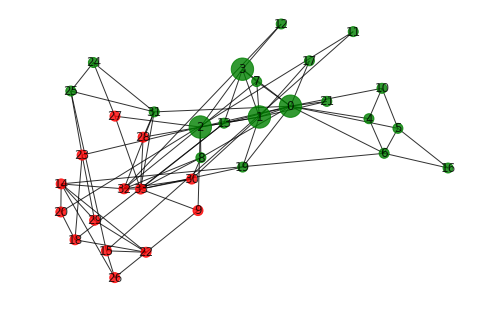

round 71


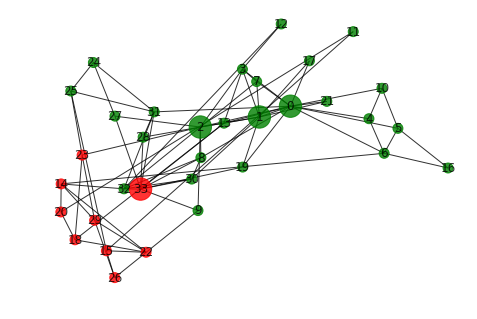

round 72


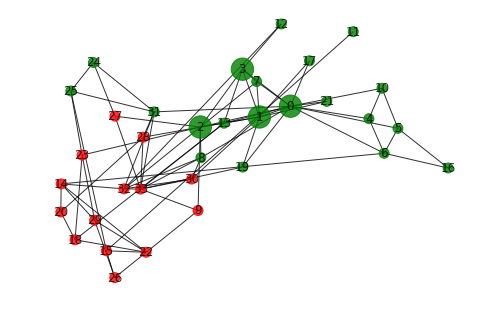

round 73


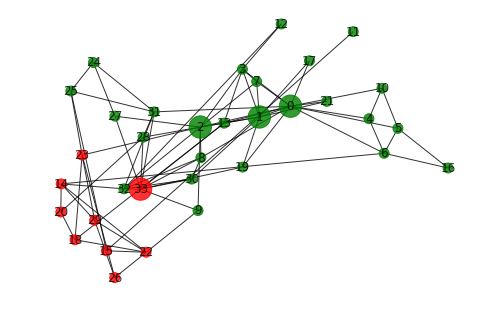

round 74


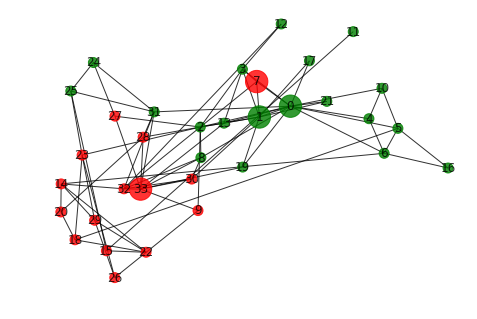

round 75


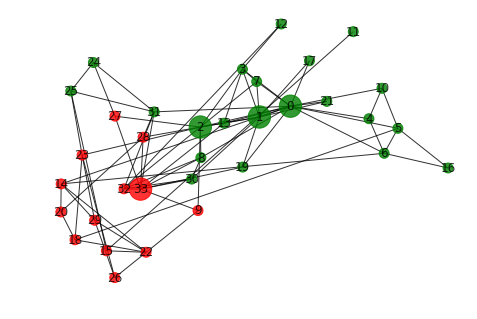

round 76


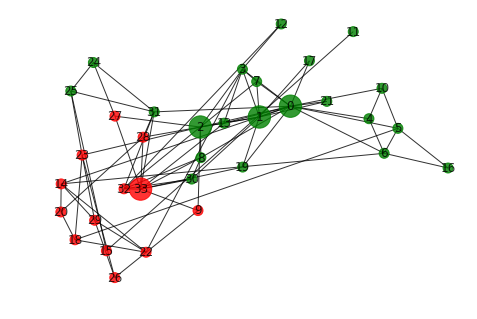

round 77


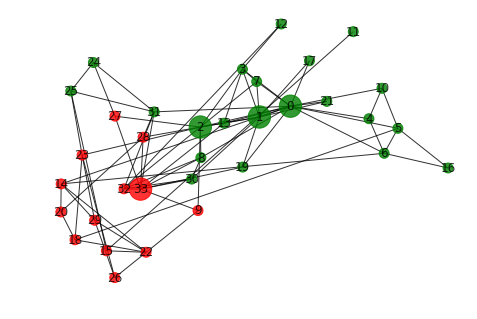

round 78


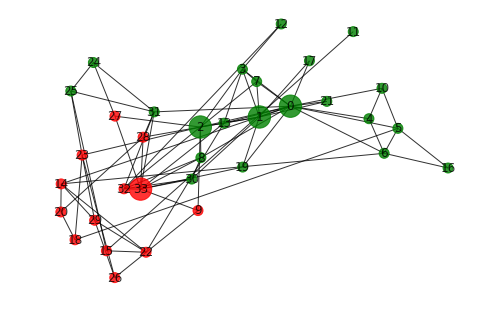

round 79


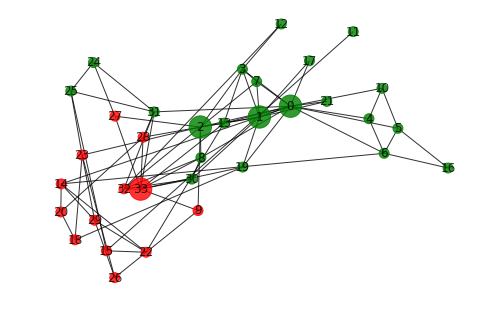

round 80


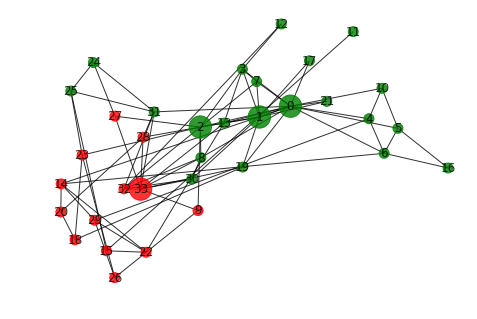

round 81


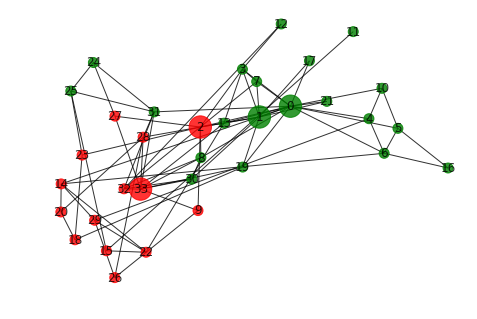

round 82


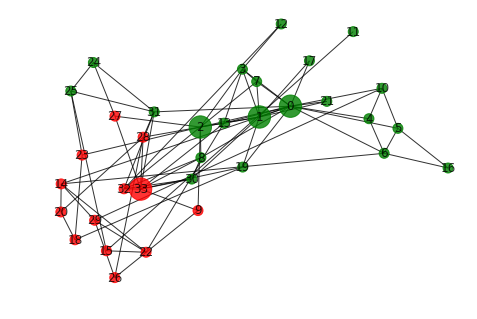

round 83


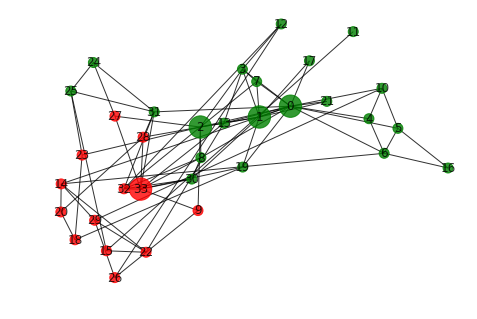

round 84


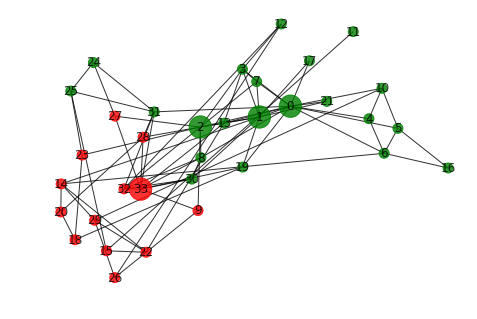

round 85


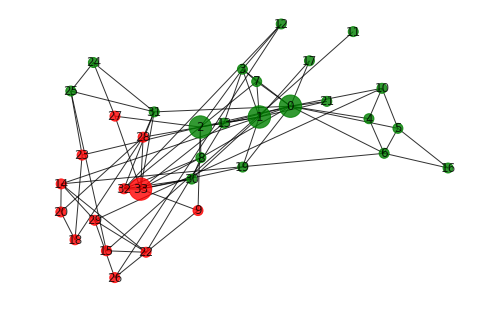

round 86


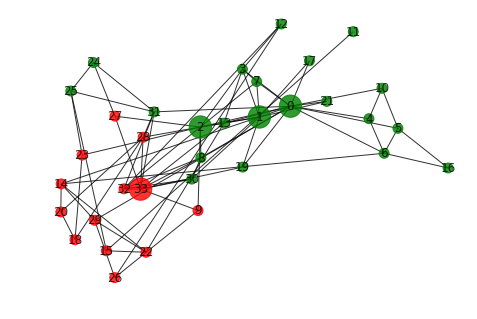

round 87


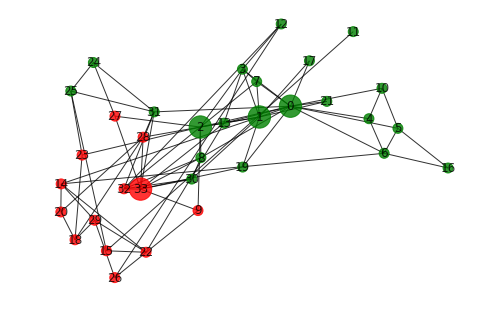

round 88


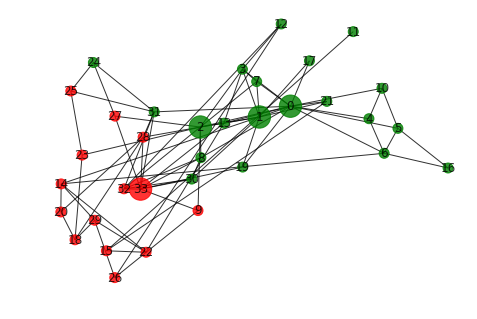

round 89


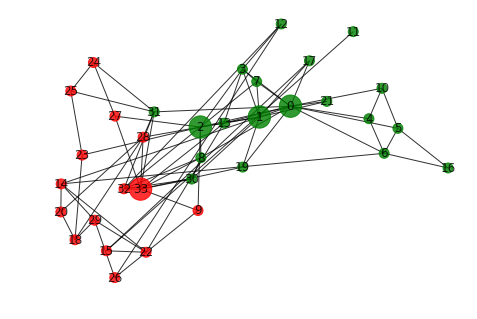

round 90


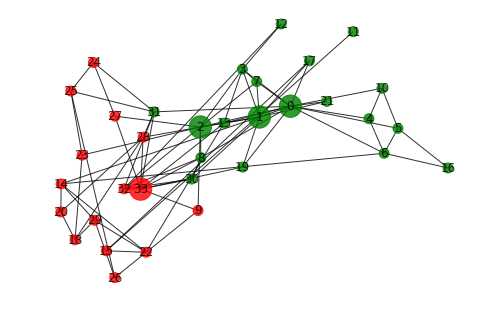

round 91


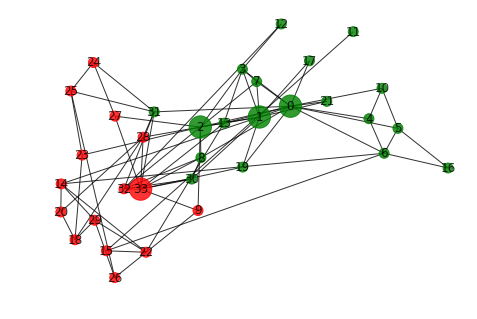

round 92


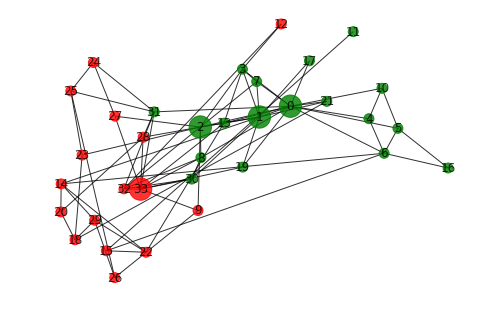

round 93


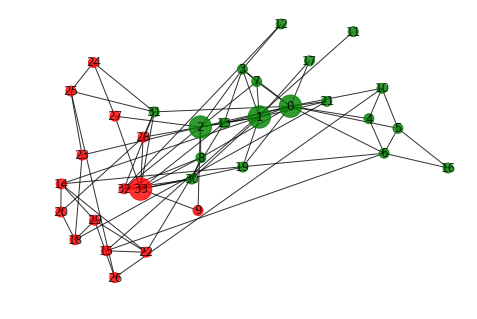

round 94


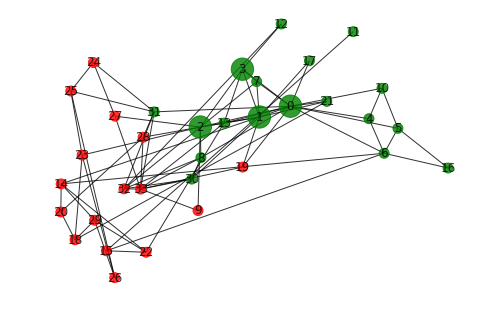

round 95


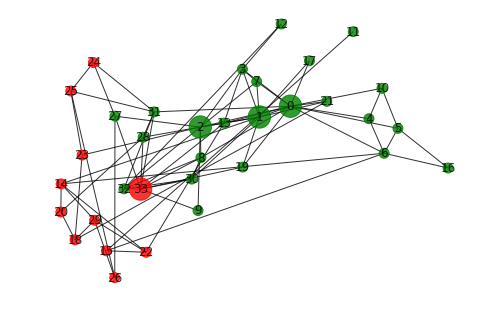

round 96


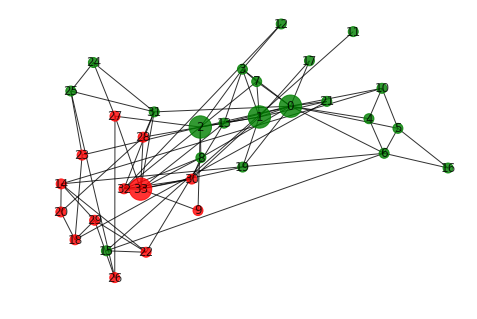

round 97


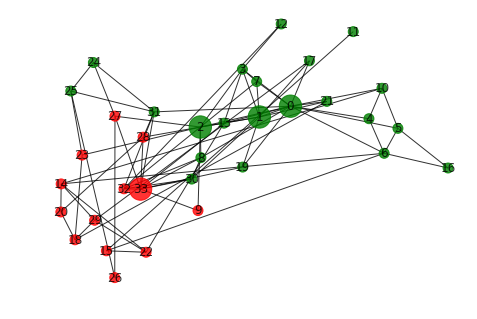

round 98


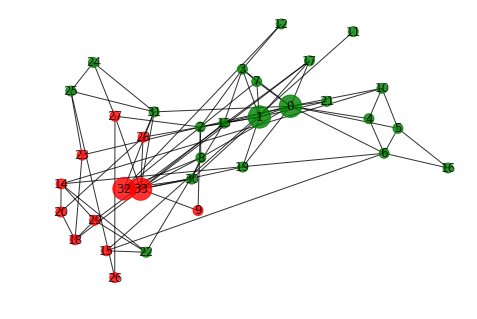

round 99


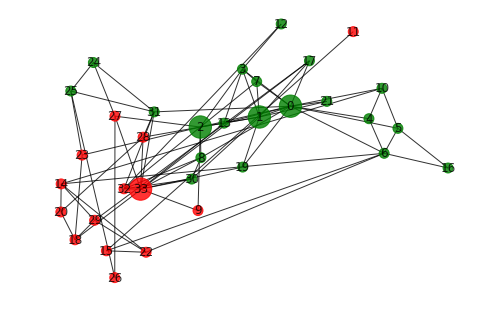

round 100


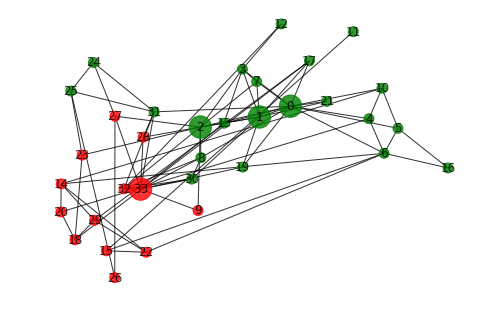

In [49]:
# Play a couple rounds.
# Defectors drawn as red, collaborators drawn as green
# by default. 
# Best 4 players are shown big.
num_rounds = 100
role_history = np.zeros([num_rounds + 1, G.number_of_nodes()])
# initialization
old_role = role.copy()
role_history[0, :] = old_role  # initialization is 1st row
# save memory by replacing role_history with num_defectors
num_defectors = [sum(old_role)]  
for round in range(1, num_rounds + 1):
    # Play the game
    points = get_points(old_role, pts_DC = 1.4)
    new_role = get_new_mutrole(old_role, neighbors, points, 
                               G, p_m = 0.01)
    # rewire G function here
    G = rewire_lowest(points, G)
    
    # Save results
    role_history[round, :] = new_role
    num_defectors.append(sum(new_role)) # less data used
    # removed normalization by popularity
    # points_norm = points / np.array(list(player_numneighbors.values()))
    # Top 4 players
    points_rank = np.argsort(points)[::-1]
    best4 = points_rank[0:4]
    # Draw result
    print(f"round {round}")
    draw_defectors(G, pos, old_role, best4)
    # Update network
    old_role = new_role

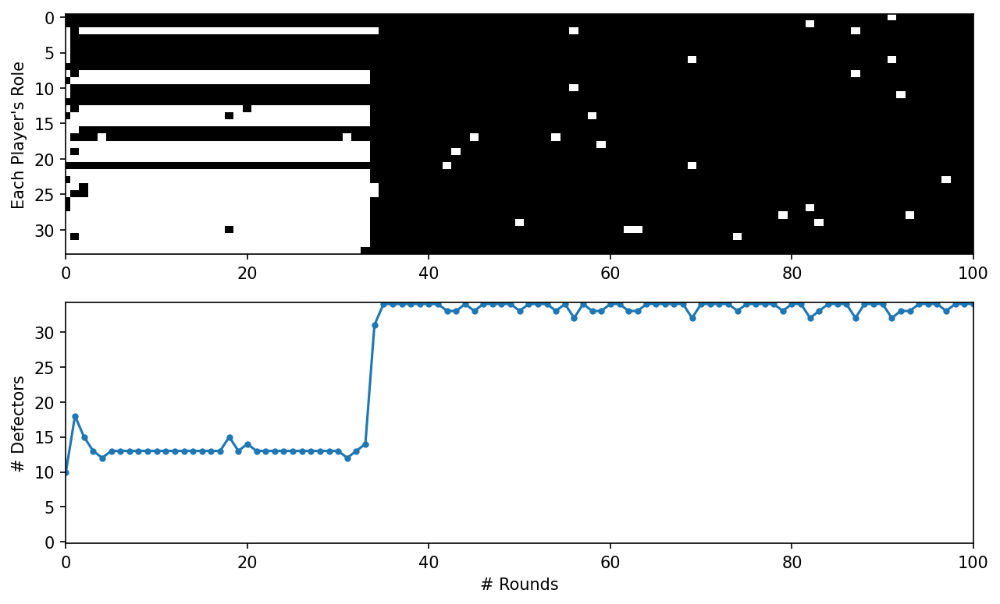

In [38]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=[10, 6],
                               dpi=150)

ax1.imshow(role_history.T, cmap='Greys', aspect='auto')
ax2.plot(num_defectors, '.-')
ax2.set_ylim([0-0.2, G.number_of_nodes()+0.2])
for ax in [ax1, ax2]:
    ax.set_xlim([0, num_rounds])
#
ax1.set_ylabel("Each Player's Role")
ax2.set_xlabel('# Rounds')
ax2.set_ylabel('# Defectors')
plt.show()

# Play more rounds

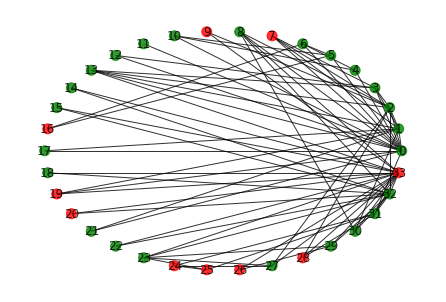

In [126]:
G, role = init_karate_club(num_defectors=10)

round 100


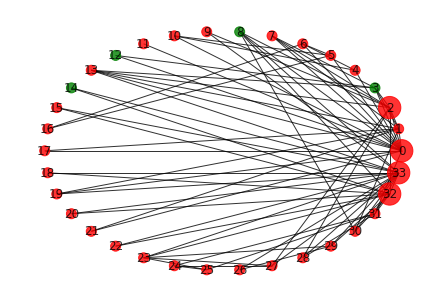

round 200


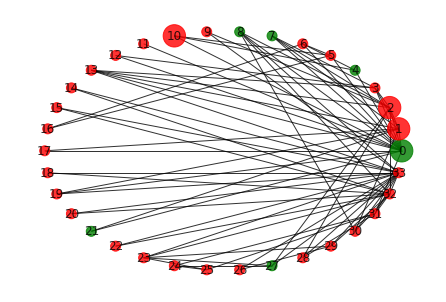

round 300


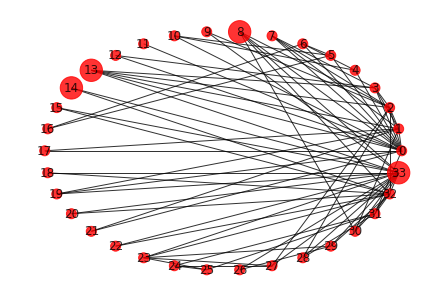

round 400


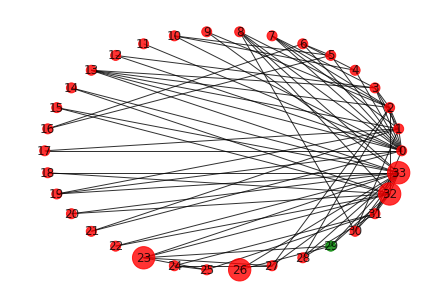

round 500


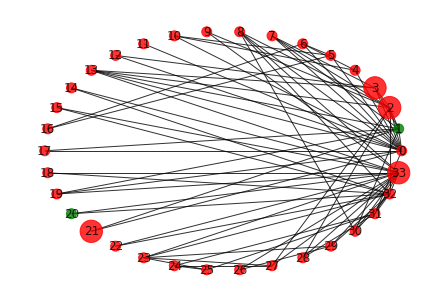

round 600


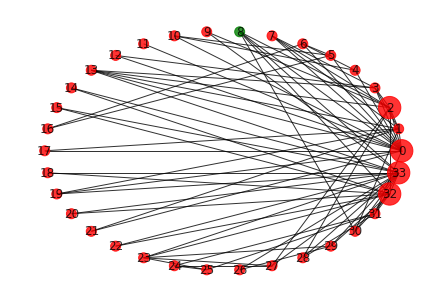

round 700


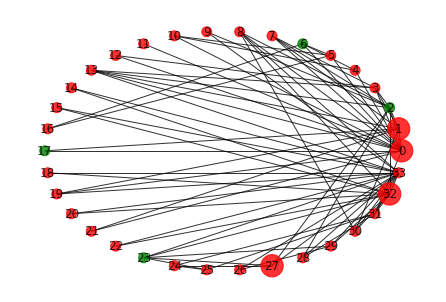

round 800


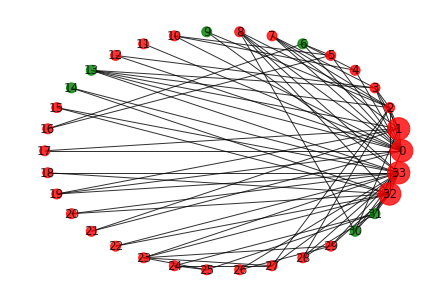

round 900


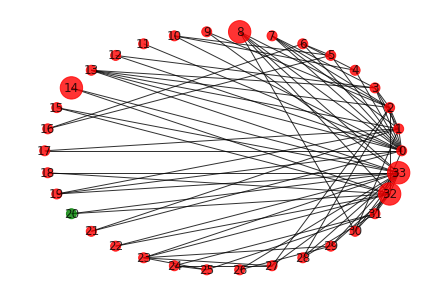

round 1000


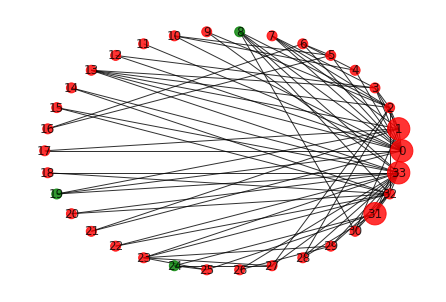

round 1100


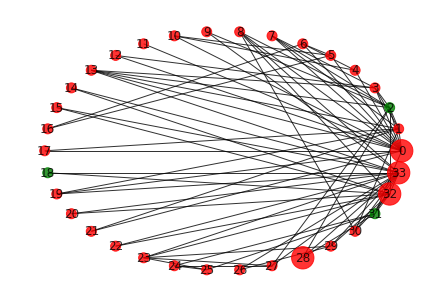

round 1200


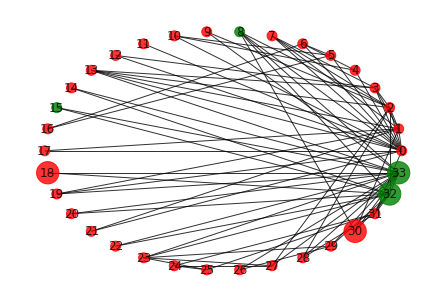

round 1300


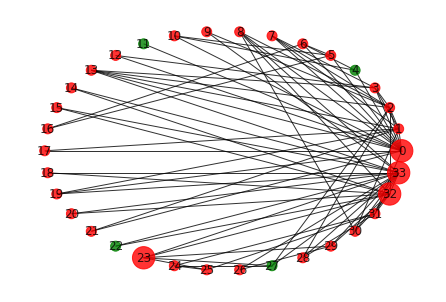

round 1400


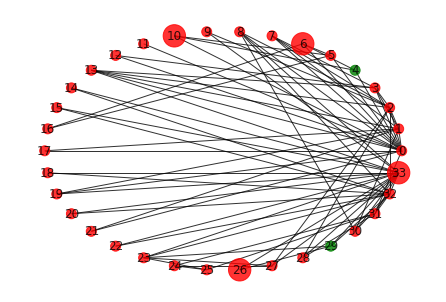

round 1500


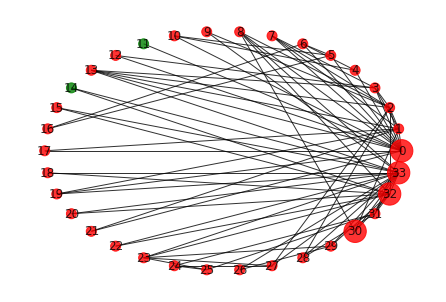

round 1600


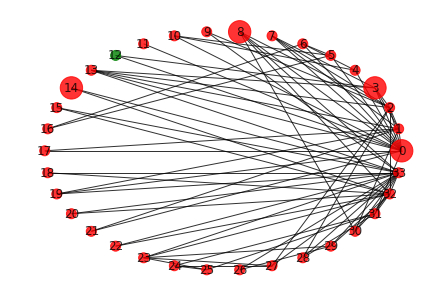

round 1700


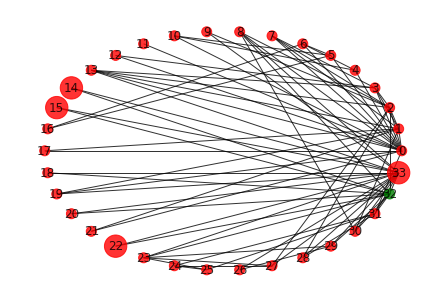

round 1800


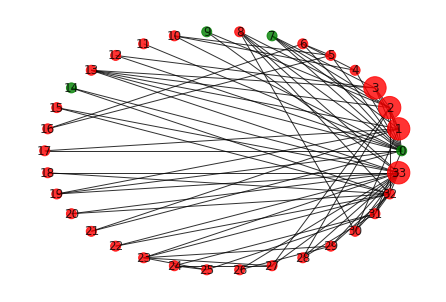

round 1900


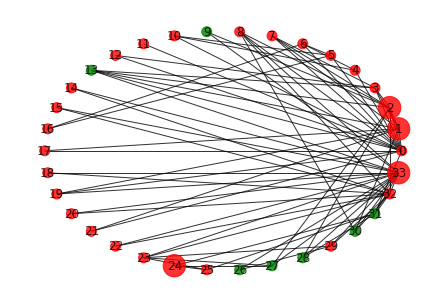

round 2000


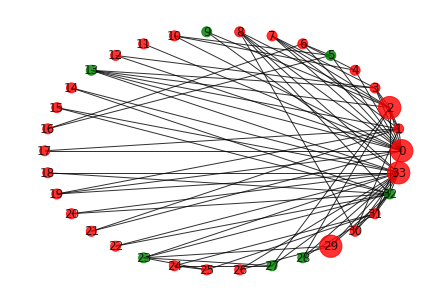

round 2100


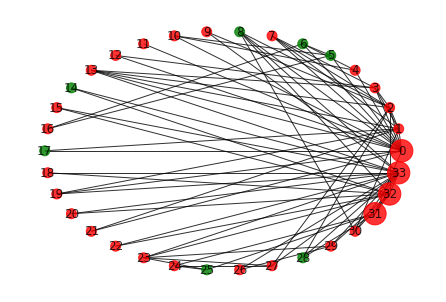

round 2200


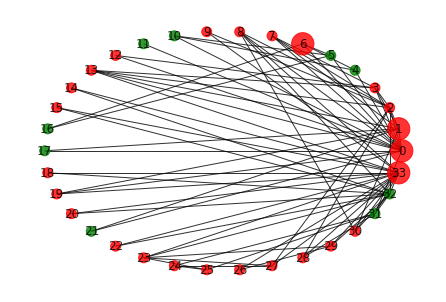

round 2300


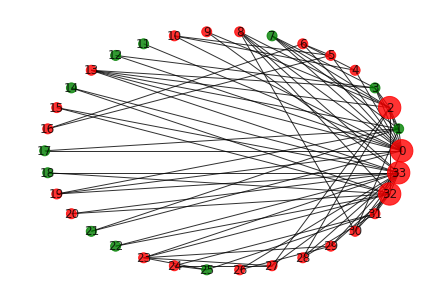

round 2400


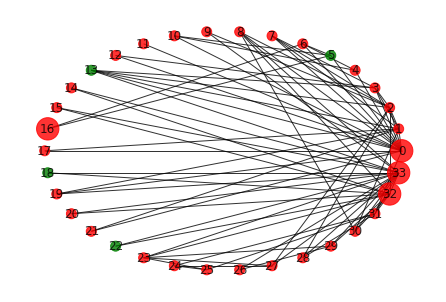

round 2500


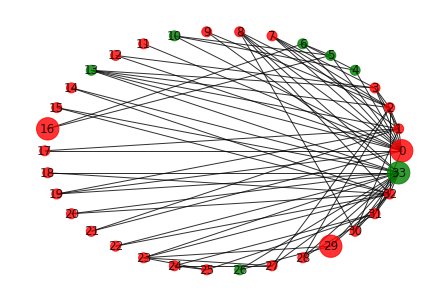

round 2600


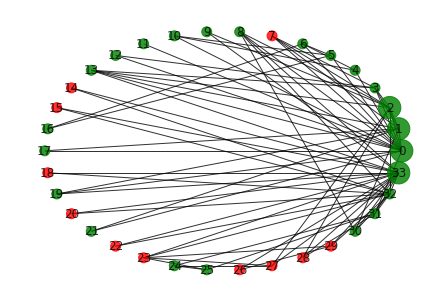

round 2700


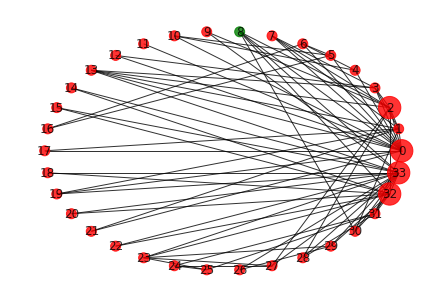

round 2800


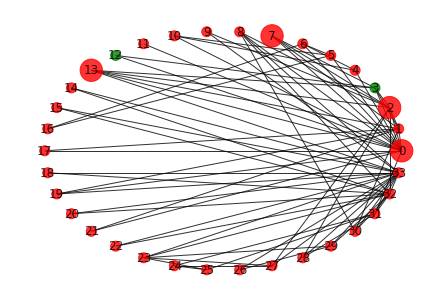

round 2900


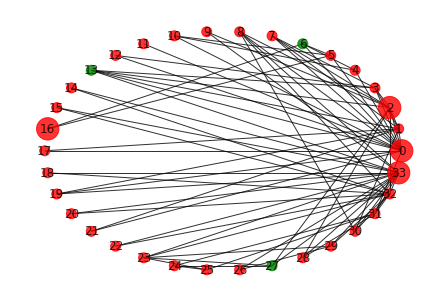

round 3000


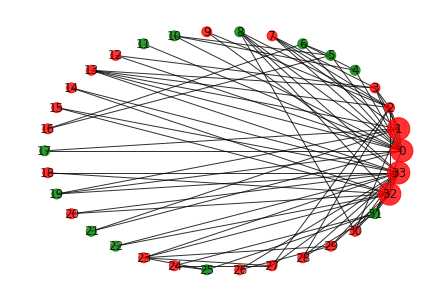

round 3100


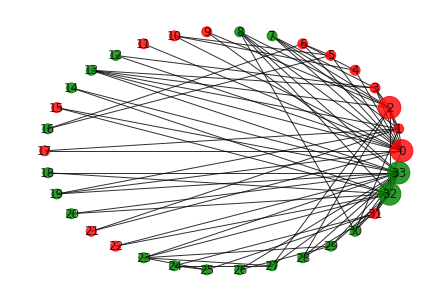

round 3200


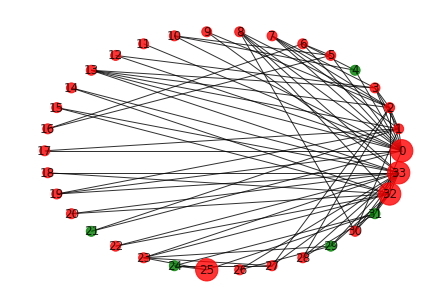

round 3300


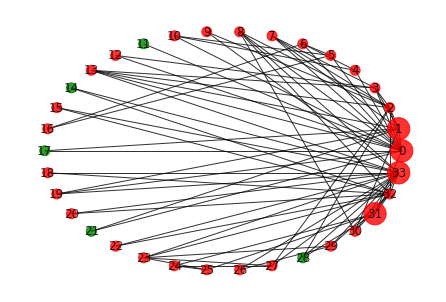

round 3400


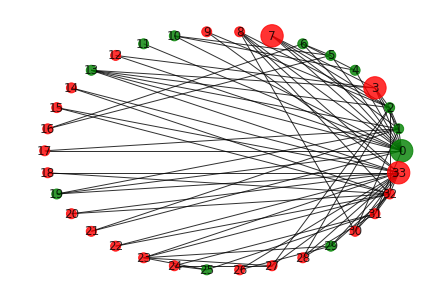

round 3500


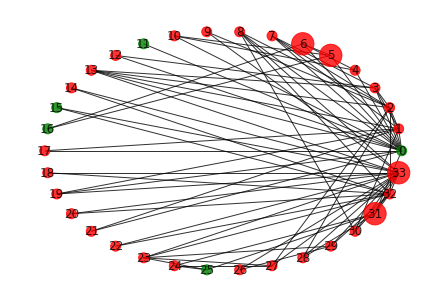

round 3600


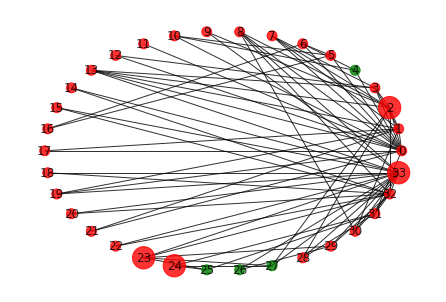

round 3700


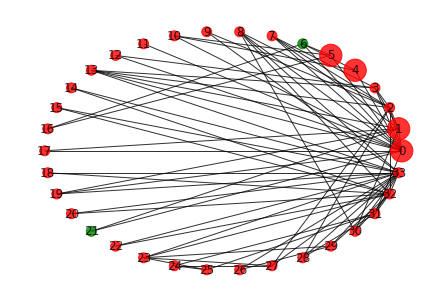

round 3800


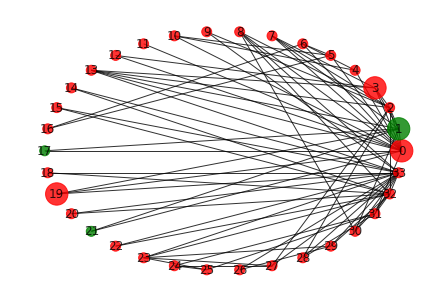

round 3900


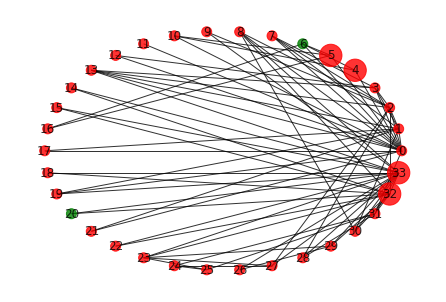

round 4000


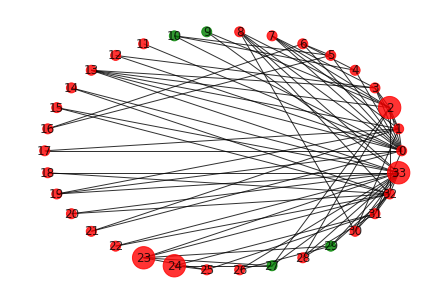

round 4100


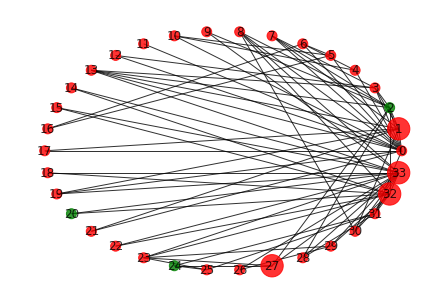

round 4200


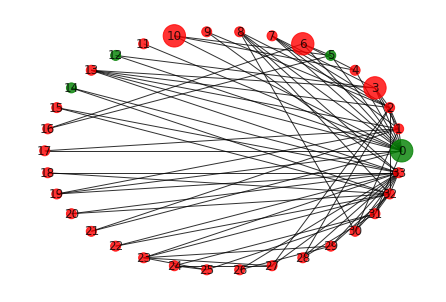

round 4300


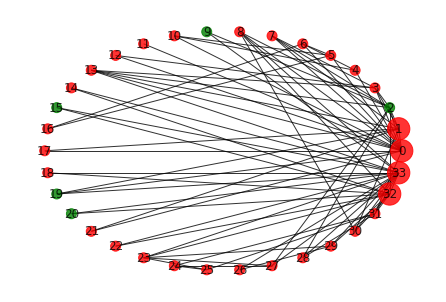

round 4400


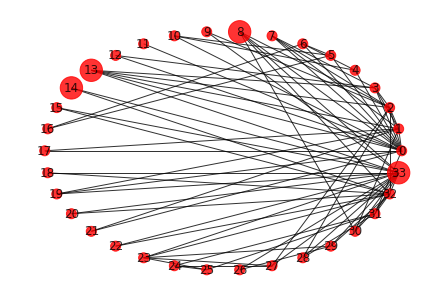

round 4500


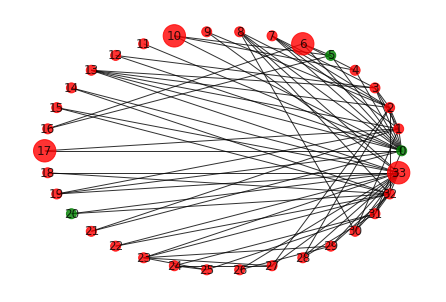

round 4600


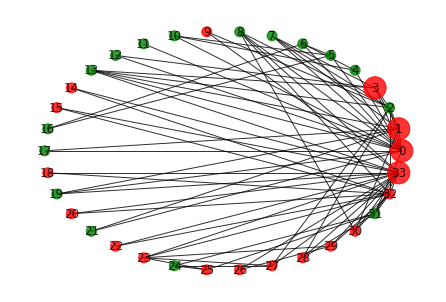

round 4700


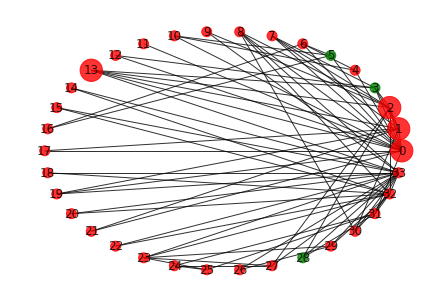

round 4800


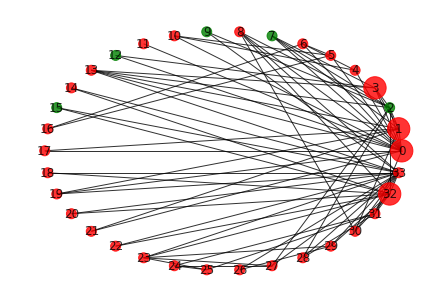

round 4900


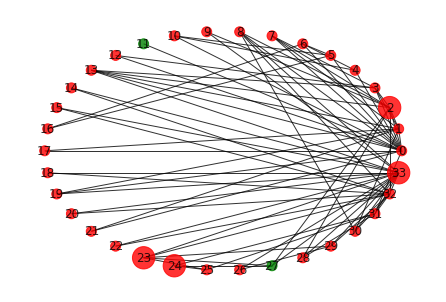

round 5000


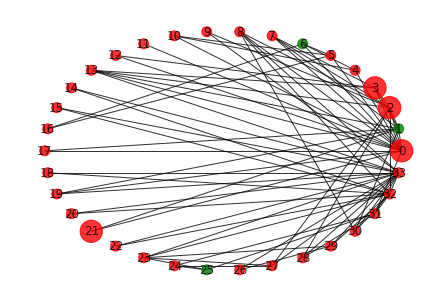

round 5100


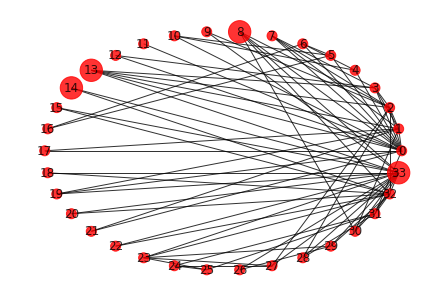

round 5200


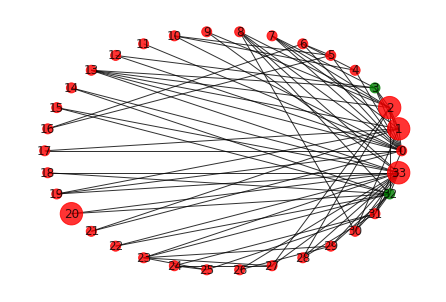

round 5300


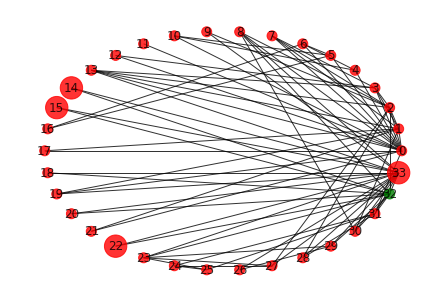

round 5400


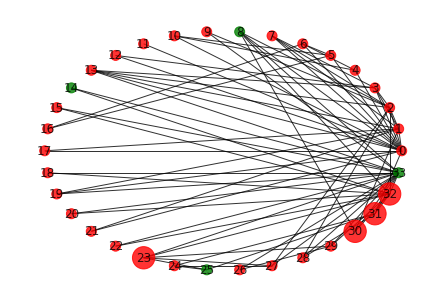

round 5500


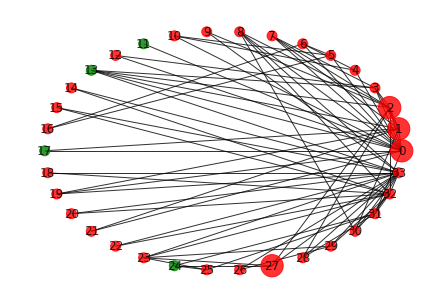

round 5600


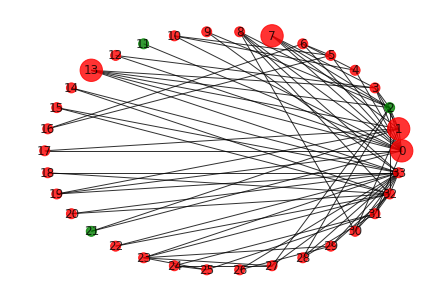

round 5700


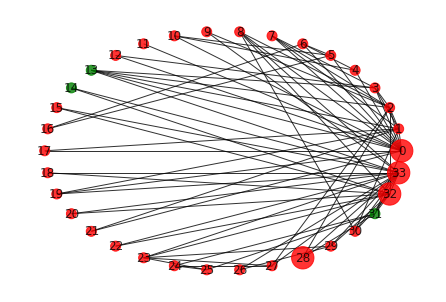

round 5800


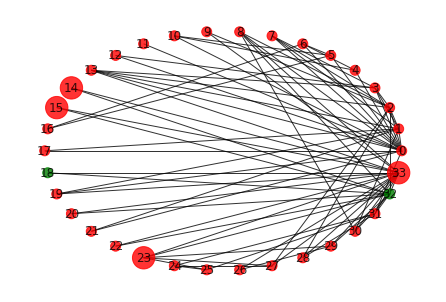

round 5900


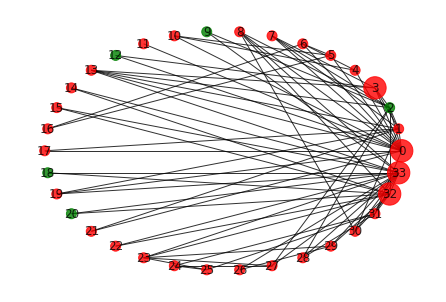

round 6000


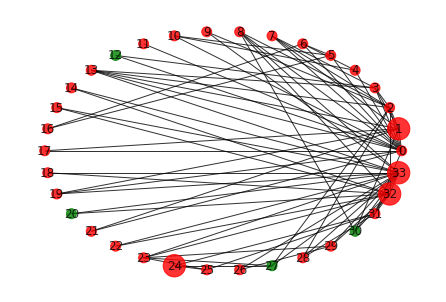

round 6100


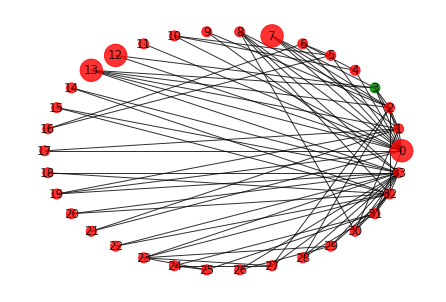

round 6200


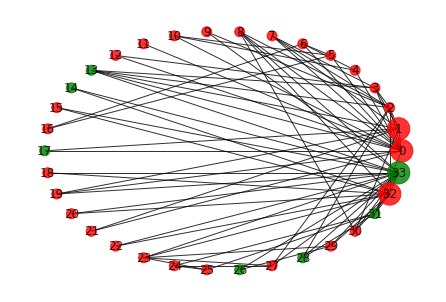

round 6300


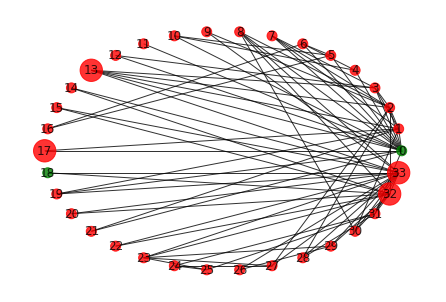

round 6400


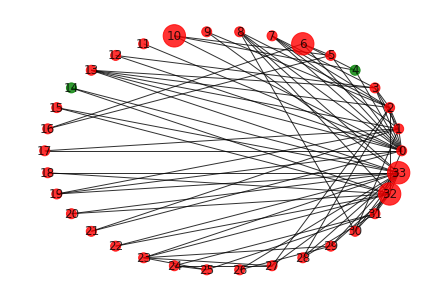

round 6500


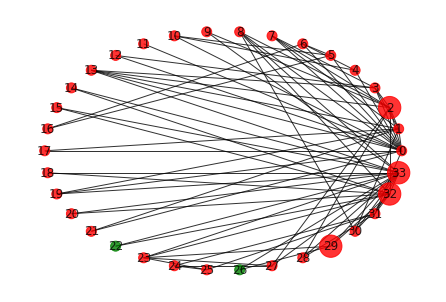

round 6600


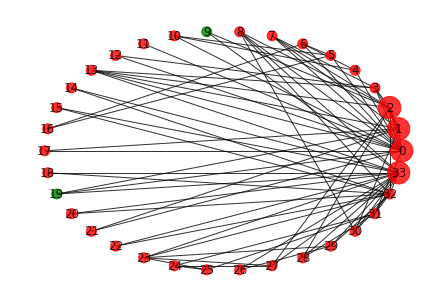

round 6700


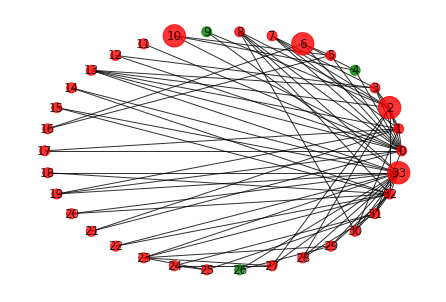

round 6800


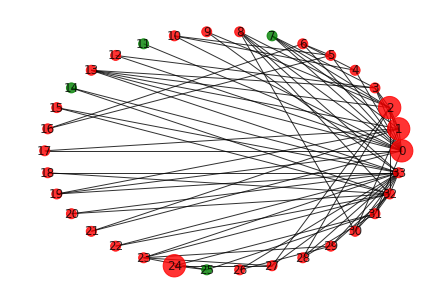

round 6900


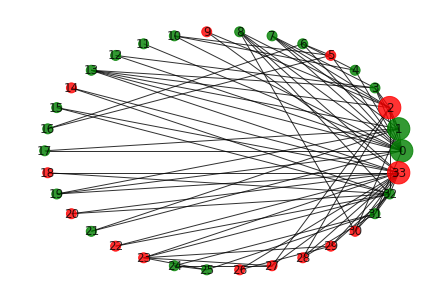

round 7000


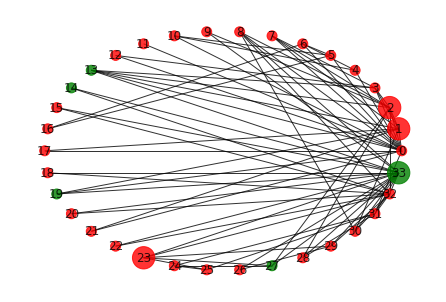

round 7100


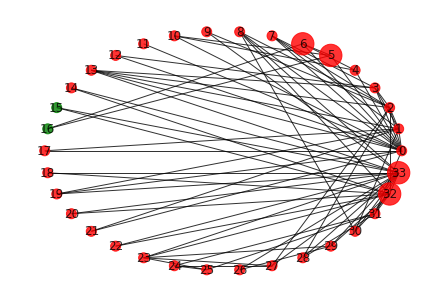

round 7200


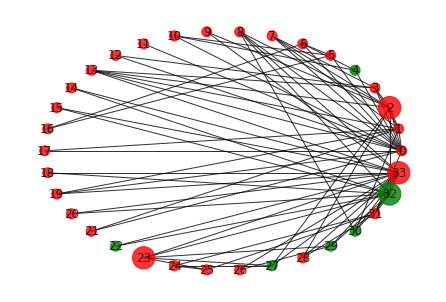

round 7300


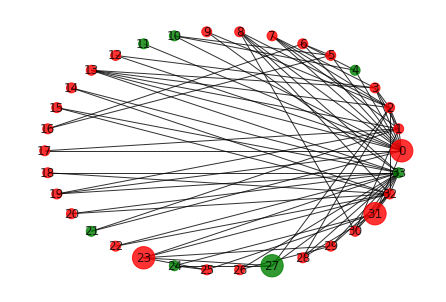

round 7400


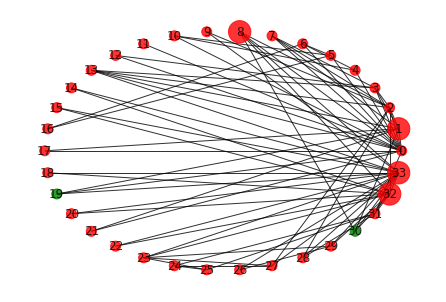

round 7500


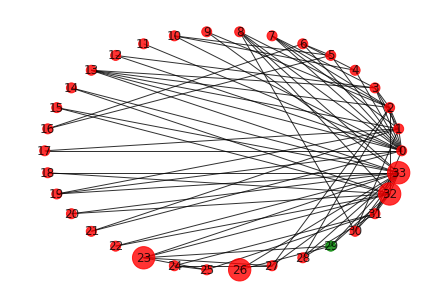

round 7600


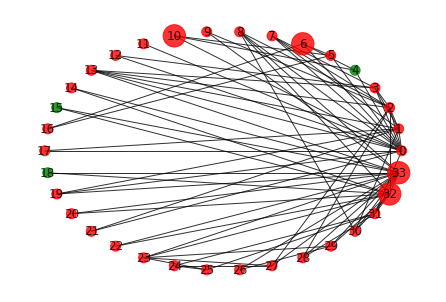

round 7700


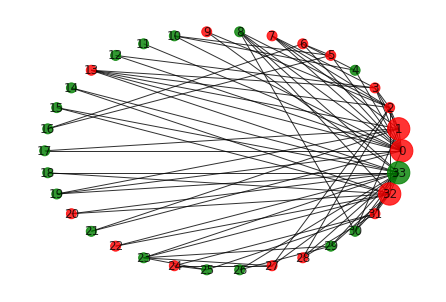

round 7800


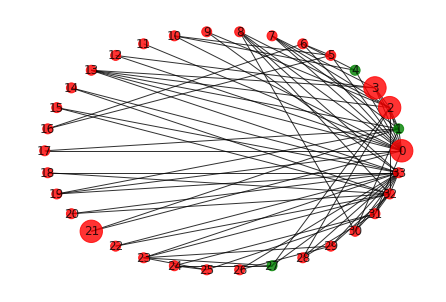

round 7900


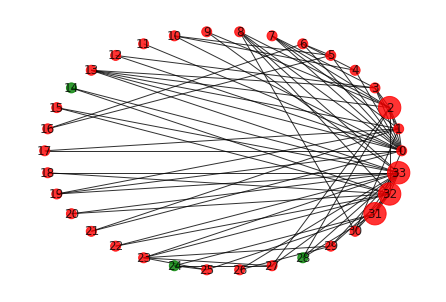

round 8000


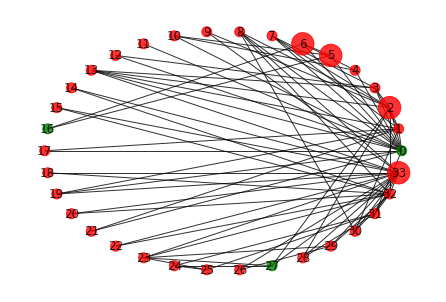

round 8100


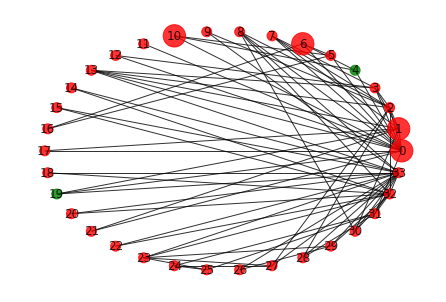

round 8200


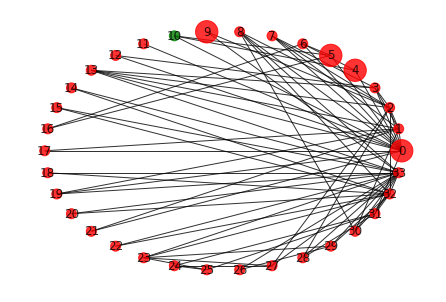

round 8300


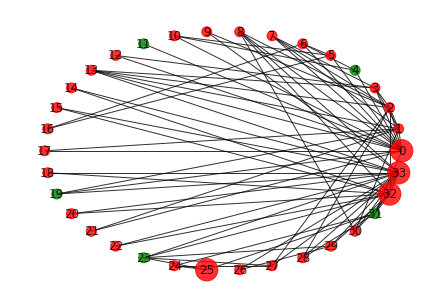

round 8400


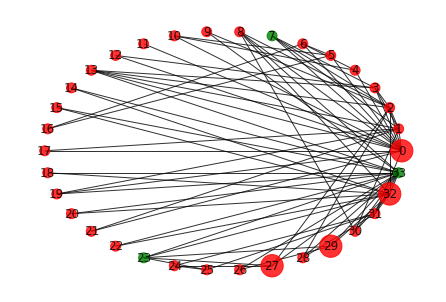

round 8500


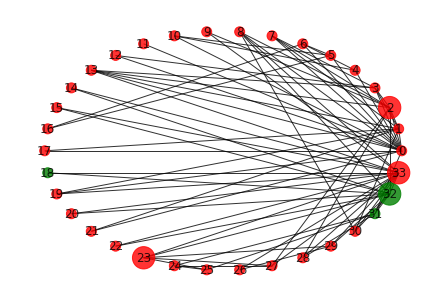

round 8600


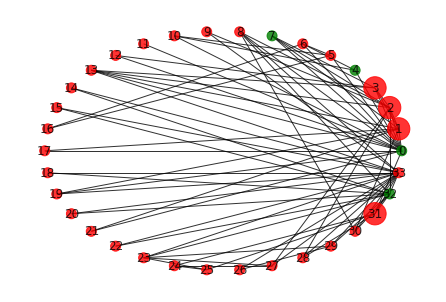

round 8700


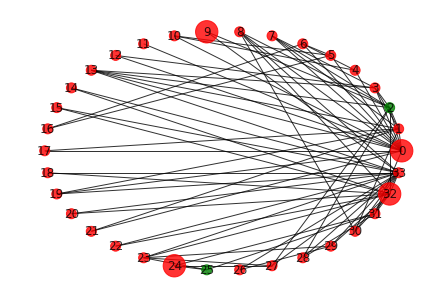

round 8800


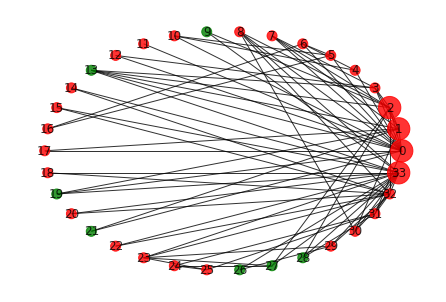

round 8900


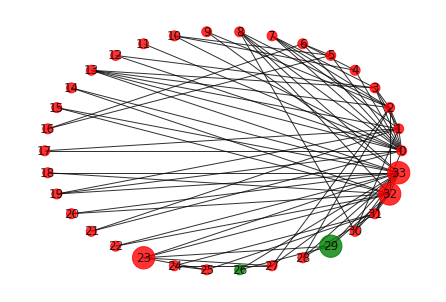

round 9000


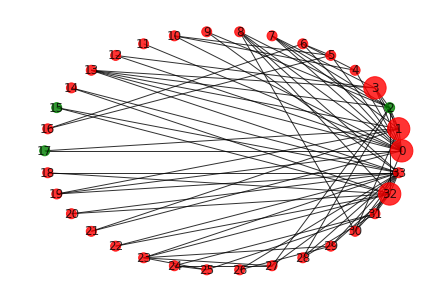

round 9100


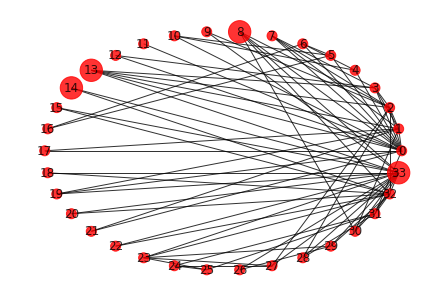

round 9200


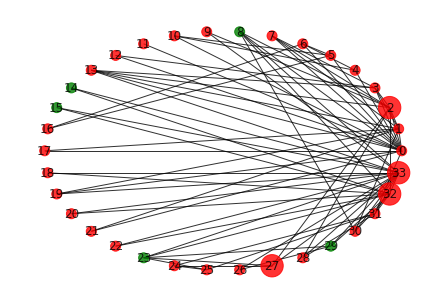

round 9300


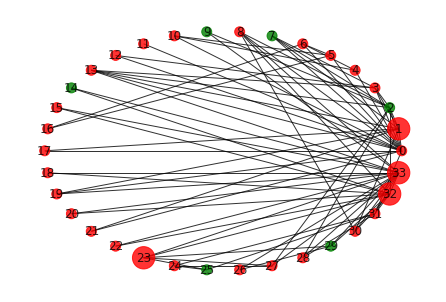

round 9400


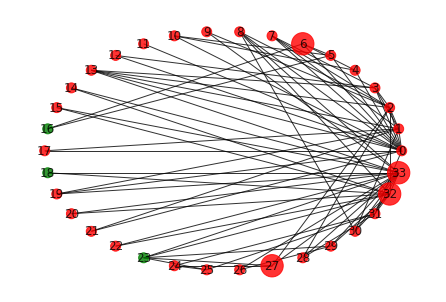

round 9500


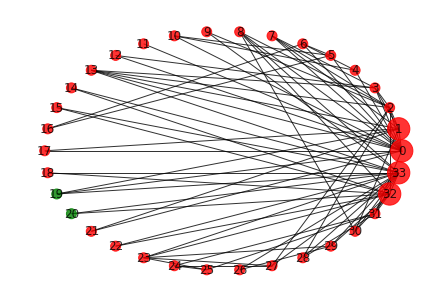

round 9600


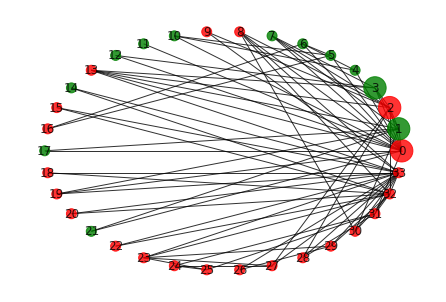

round 9700


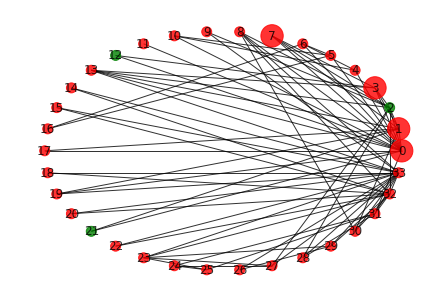

round 9800


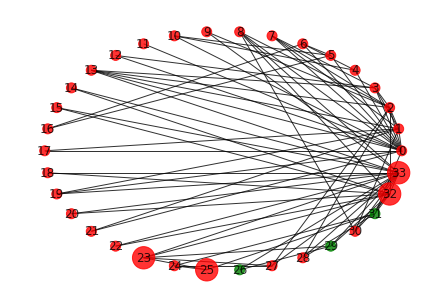

round 9900


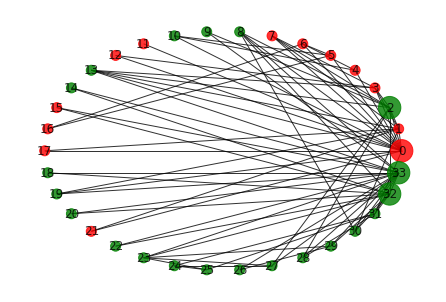

round 10000


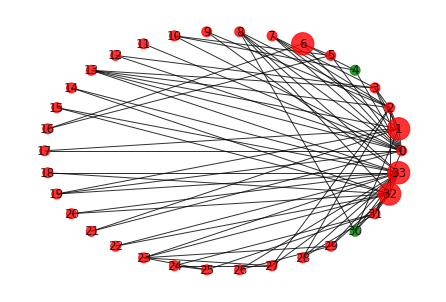

In [127]:
rewire_fxn = rewire_to_utopia
# rewire_fxn = rewire_lowest
rewire_fxn = no_rewire

num_rounds = 10000  # Play many more rounds
show_rounds = 100  # Only show some rounds
role_history = np.zeros([num_rounds + 1, G.number_of_nodes()])
# initialization
old_role = role.copy()
role_history[0, :] = old_role  # initialization is 1st row
# save memory by replacing role_history with num_defectors
num_defectors = [sum(old_role)]  
for round in range(1, num_rounds + 1):
    # Play the game
    points = get_points(old_role, pts_DC = 1.4)
    new_role = get_new_mutrole(old_role, neighbors, points, 
                               G, p_m = 0.1)
    
    # rewire G function here
    G = rewire_fxn(points, G, role)
    
    # Save results
    role_history[round, :] = new_role
    num_defectors.append(sum(new_role)) # less data used
    # Only show some rounds
    if round % show_rounds == 0:
        # Top 4 players
        points_rank = np.argsort(points)[::-1]
        best4 = points_rank[0:4]
        # Draw result
        print(f"round {round}")
        draw_defectors(G, pos, old_role, best4)
    # Update network
    old_role = new_role

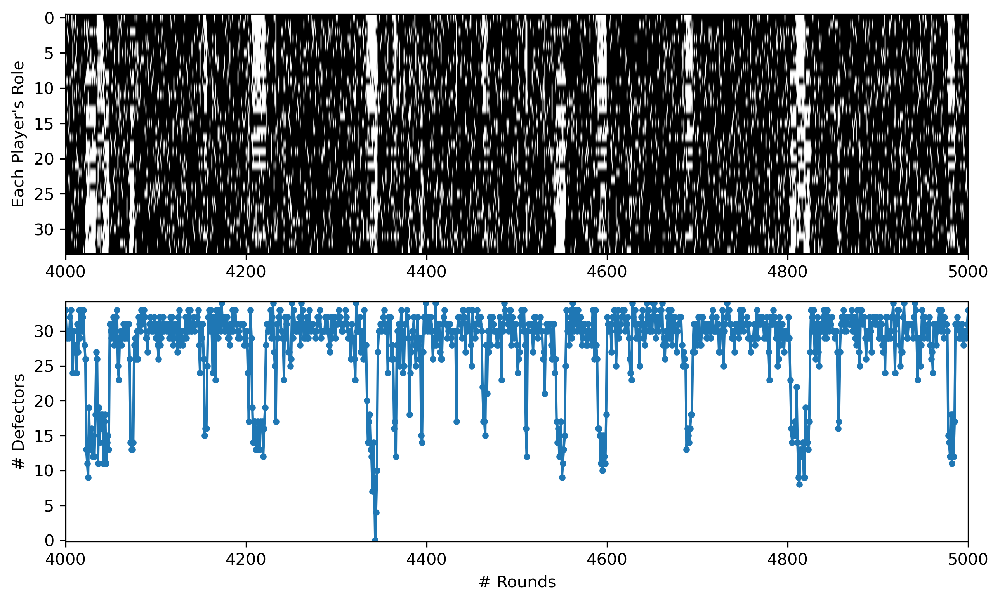

In [128]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=[10, 6],
                               dpi=300)

ax1.imshow(role_history.T, cmap='Greys', aspect='auto')
ax2.plot(num_defectors, '.-')
ax2.set_ylim([0-0.2, G.number_of_nodes()+0.2])
for ax in [ax1, ax2]:
    ax.set_xlim([0, num_rounds])
    ax.set_xlim([4000, 5000])
#
ax1.set_ylabel("Each Player's Role")
ax2.set_xlabel('# Rounds')
ax2.set_ylabel('# Defectors')

plt.show()

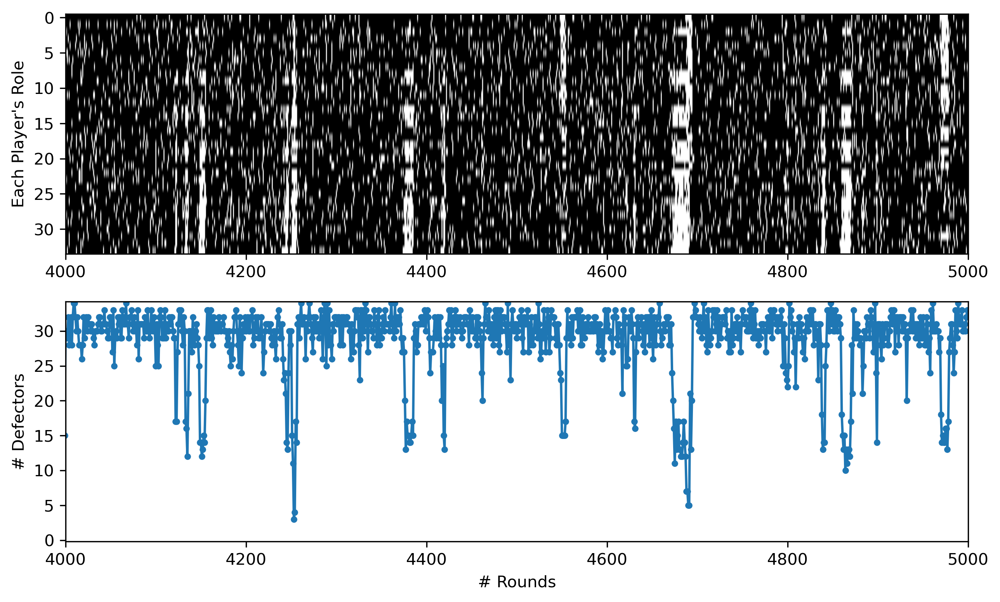

In [124]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=[10, 6],
                               dpi=300)

ax1.imshow(role_history.T, cmap='Greys', aspect='auto')
ax2.plot(num_defectors, '.-')
ax2.set_ylim([0-0.2, G.number_of_nodes()+0.2])
for ax in [ax1, ax2]:
    ax.set_xlim([0, num_rounds])
    ax.set_xlim([4000, 5000])
#
ax1.set_ylabel("Each Player's Role")
ax2.set_xlabel('# Rounds')
ax2.set_ylabel('# Defectors')

plt.show()

# Play a LOT of rounds

In [119]:
num_rounds = 10**6  # Play many more rounds
show_rounds = 10**4  # Only show some rounds
role_history = np.zeros([num_rounds + 1, G.number_of_nodes()])
# initialization
old_role = role.copy()
# save memory by replacing role_history with num_defectors
num_defectors = [sum(old_role)]  
for round in range(1, num_rounds + 1):
    # Play the game
    points = get_points(old_role, pts_DC = 1.4)
    new_role = get_new_mutrole(old_role, neighbors, points, 
                               G, p_m = 0.01)
    
    # rewire G function here
    G = rewire_lowest(points, G)
    
    # Save results
    num_defectors.append(sum(new_role)) # less data used
    # Only show some rounds
    if round % show_rounds == 0:
        # Top 4 players
        points_rank = np.argsort(points)[::-1]
        best4 = points_rank[0:4]
        # Draw result
        print(f"round {round}")
        draw_defectors(G, pos, old_role, best4)
    # Update network
    old_role = new_role

NameError: name 'rewire_lowest' is not defined

In [68]:
no_defect = np.argwhere(np.array(num_defectors) == 0).flatten()
dt_no_defect = np.diff(no_defect)
dt_no_defect
no_defect

array([     2,      5,      6,      7,      8,      9,     11,     12,
           14,     15,     16,     17,     18,     19,     20,     21,
           23, 897606, 897607, 897608, 897609, 897610, 897611, 897612,
       897613, 897614, 897615, 897616, 897617, 897620, 897621, 897622,
       897623, 897627, 897628, 897629, 897630, 897632, 897633, 897634,
       897635, 897636, 897637, 897639, 897640])

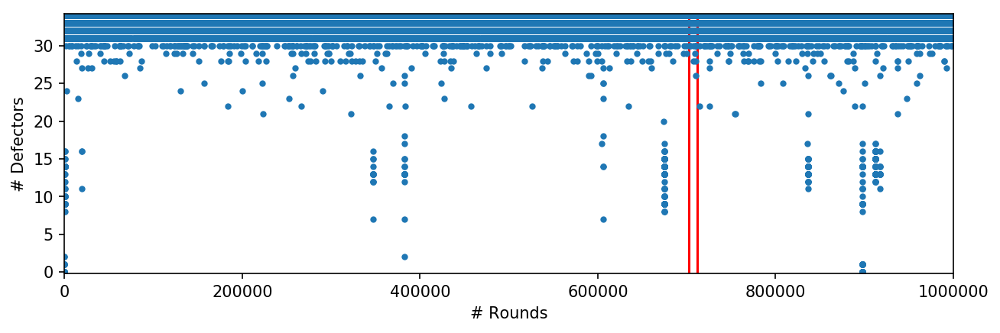

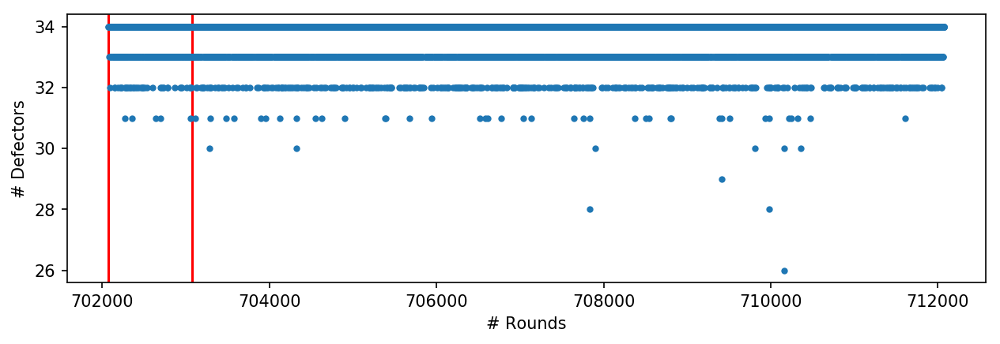

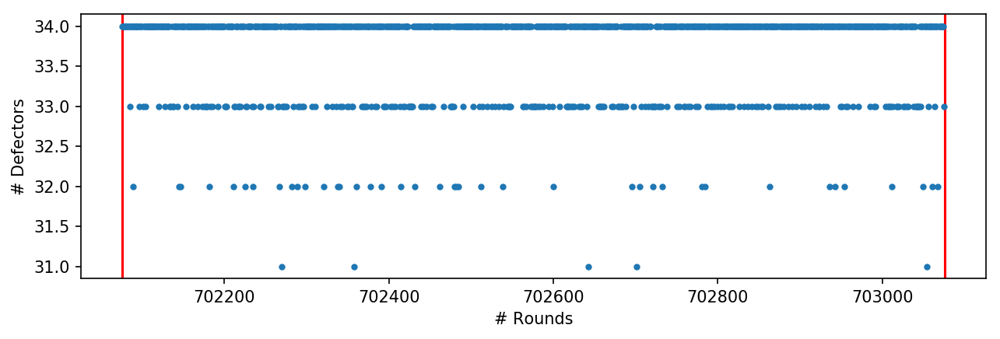

In [65]:
# x0 = int(0.7015*10**6)
x0 = 702076
dt1 = int(1*10**4)
dt2 = int(1*10**3)

t = np.array(range(len(num_defectors)))
fig, ax = plt.subplots(1, 1, figsize=[10, 3],
                               dpi=150)

ax.plot(t, num_defectors, '.')
ax.set_ylim([0-0.2, G.number_of_nodes()+0.2])
ax.set_xlim([0, num_rounds])
ax.set_xlabel('# Rounds')
ax.set_ylabel('# Defectors')
ymin, ymax = ax.get_ylim()
ax.vlines([x0, x0 + dt1], ymin, ymax, color='r')
ax.set_ylim([ymin, ymax])
plt.show()

fig, ax = plt.subplots(1, 1, figsize=[10, 3],
                               dpi=150)
ax.plot(t[x0:x0+dt1],
        num_defectors[x0:x0+dt1], 
        '.')
ax.set_xlabel('# Rounds')
ax.set_ylabel('# Defectors')
ymin, ymax = ax.get_ylim()
ax.vlines([x0, x0 + dt2], ymin, ymax, color='r')
ax.set_ylim([ymin, ymax])
plt.show()

fig, ax = plt.subplots(1, 1, figsize=[10, 3],
                               dpi=150)
ax.plot(t[x0:x0+dt2],
        num_defectors[x0:x0+dt2], 
        '.')
ax.set_xlabel('# Rounds')
ax.set_ylabel('# Defectors')
ymin, ymax = ax.get_ylim()
ax.vlines([x0, x0 + dt2], ymin, ymax, color='r')
ax.set_ylim([ymin, ymax])
plt.show()

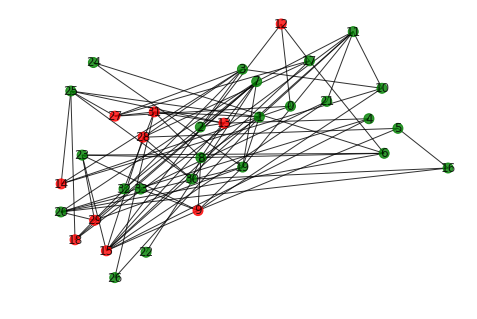

In [66]:
draw_defectors(G, pos, role)

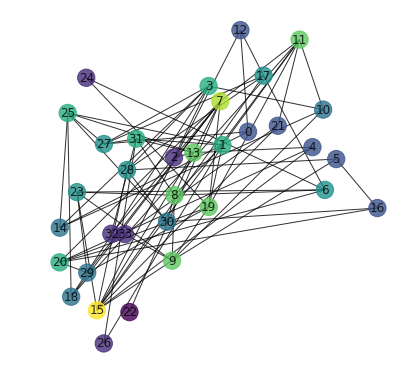

In [67]:
degree_centrality = nx.degree_centrality(G)
color_centrality = list(degree_centrality.values())

plt.figure(figsize=[5, 5])
nx.draw(G, pos=pos, 
                 node_color=color_centrality,
                 alpha=0.8,
                 with_labels=True)
plt.show()